# Chapter 8: A few additional topics in Image Processing and Computer Vision

## 1. Reconstruction of an image from its gradient values

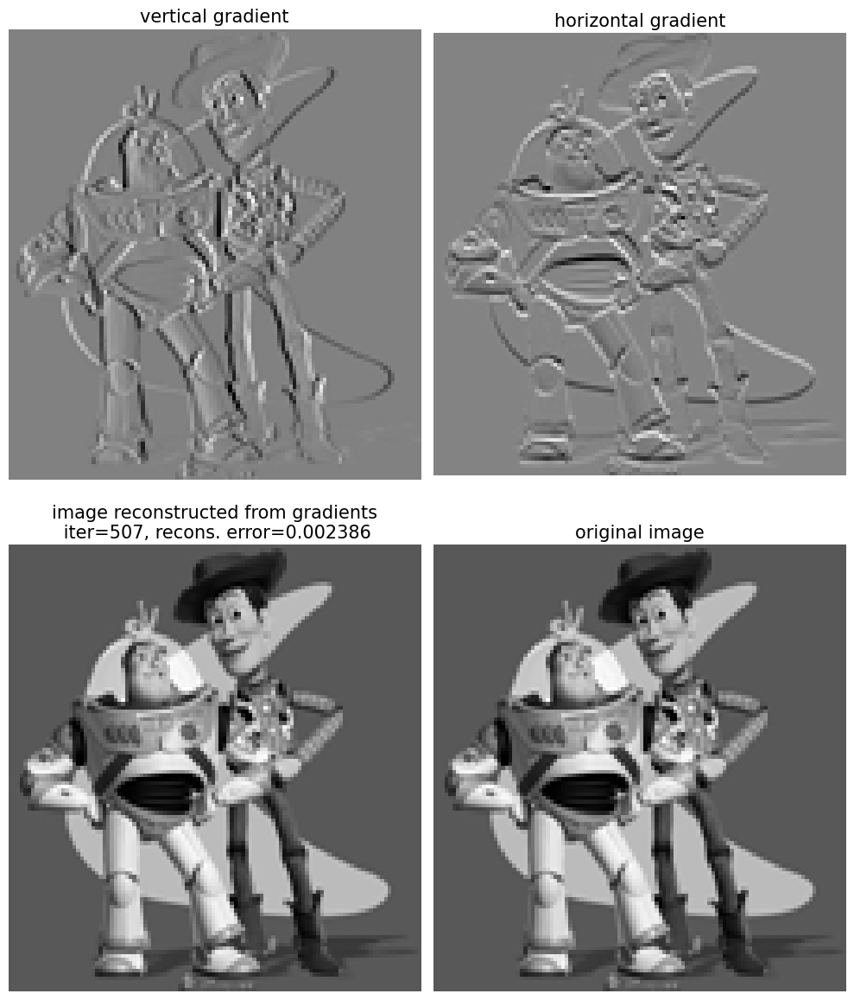

1 507 0.002386067041366577


In [2]:
import numpy as np
import cv2
import scipy.sparse.linalg
import matplotlib.pylab as plt
from scipy.sparse import csc_matrix

im = cv2.imread('images/toy.png', 0)
im = im / im.max()
#plt.imshow(im)
#plt.show()

# Create Matrix For Easy Subscript-To-Linear-Index Conversion
h, w = im.shape
im2var = np.arange(h * w).reshape(h, w)

#print(h, w)

# Calculate Number of Equations To Produce
ne = 2*h*w - h - w + 1

data, row, col = [], [], []

# Create Result Vector b
b = np.zeros((ne+1, 1));

Ix = np.zeros((w-1, h))
for x in range(w-1):
    for y in range(h):
        Ix[x,y] = im[y,x+1] - im[y,x]

Iy = np.zeros((w, h-1))
for x in range(w):
    for y in range(h-1):
        Iy[x,y] = im[y+1,x] - im[y,x]
        

# Initialize Equation Counter
e = 0;

# Minimize Horizontal Gradient Error
for x in range(w-1):
    for y in range(h):
        e = e + 1;
        data.append(1)
        row.append(e)
        col.append(im2var[y,x+1])
        data.append(-1)
        row.append(e)
        col.append(im2var[y,x])
        #A[e][im2var[y,x+1]] = 1
        #A[e][im2var[y,x]] = -1
        b[e] = Ix[x,y] #im[y,x+1] - im[y,x]


# Minimize Vertical Gradient Error
for x in range(w):
    for y in range(h-1):
        e = e + 1;
        data.append(1)
        row.append(e)
        col.append(im2var[y+1,x])
        data.append(-1)
        row.append(e)
        col.append(im2var[y,x])
        #A[e][im2var[y+1,x]] = 1
        #A[e][im2var[y,x]] = -1
        b[e] = Iy[x,y] #im[y+1,x] - im[y,x]

# Explicitly Specify One Pixel
e = e + 1;
#A[e][im2var[0][0]] = 1
data.append(1)
row.append(e)
col.append(im2var[0,0])
b[e] = im[0,0] #s[0][0]

# Create Sparse Objective Matrix A
A = csc_matrix((data, (row, col)), shape=(ne+1, h*w))

v, istop, itn, r1norm = scipy.sparse.linalg.lsqr(A, b, iter_lim=1000)[:4]
v = np.reshape(v, im.shape)

plt.figure(figsize=(10,12))
plt.gray()
plt.subplot(221), plt.imshow(Ix.T), plt.axis('off'), plt.title('vertical gradient', size=15)
plt.subplot(222), plt.imshow(Iy.T), plt.axis('off'), plt.title('horizontal gradient', size=15)
plt.subplot(223), plt.imshow(v), plt.axis('off')
plt.title('image reconstructed from gradients\n iter={}, recons. error={:.6f}'.format(itn, r1norm), size=15)
plt.subplot(224), plt.imshow(im), plt.axis('off'), plt.title('original image', size=15)
plt.tight_layout()
plt.show()

print(istop, itn, r1norm)

In [ ]:
import numpy as np
import cv2
from scipy.sparse import spdiags
from scipy.sparse.linalg import spsolve

def reconstruct_image_from_gradients(grad_x, grad_y):
    h, w = grad_x.shape
    grad_x = grad_x.flatten()
    grad_y = grad_y.flatten()

    # Create the Laplacian matrix
    e = np.ones(h * w)
    diag_data = np.array([-4 * e, e, e, e, e])
    offsets = np.array([0, -1, 1, -w, w])
    laplacian = spdiags(diag_data, offsets, h * w, h * w)

    # Create the divergence of the gradient field
    div = np.zeros(h * w)
    div[0::w] += grad_x[0::w]
    div[1::w] -= grad_x[0::w]
    div[0:w] += grad_y[0:w]
    div[w:] -= grad_y[0:w]

    # Solve the Poisson equation
    img_flat = spsolve(laplacian, div)
    img = img_flat.reshape((h, w))

    return img

# Example usage
if __name__ == "__main__":
    # Load gradient images (for example purposes, using synthetic gradients)
    grad_x = cv2.imread('grad_x.png', cv2.IMREAD_GRAYSCALE).astype(np.float32)
    grad_y = cv2.imread('grad_y.png', cv2.IMREAD_GRAYSCALE).astype(np.float32)

    # Reconstruct the image
    reconstructed_img = reconstruct_image_from_gradients(grad_x, grad_y)

    # Display the result
    cv2.imshow('Reconstructed Image', reconstructed_img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

## 2. Gradient Blending / Poisson Image Editing

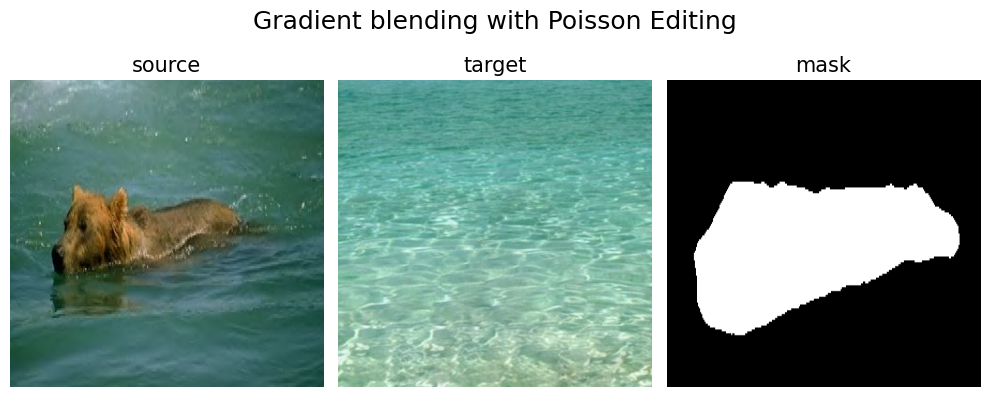

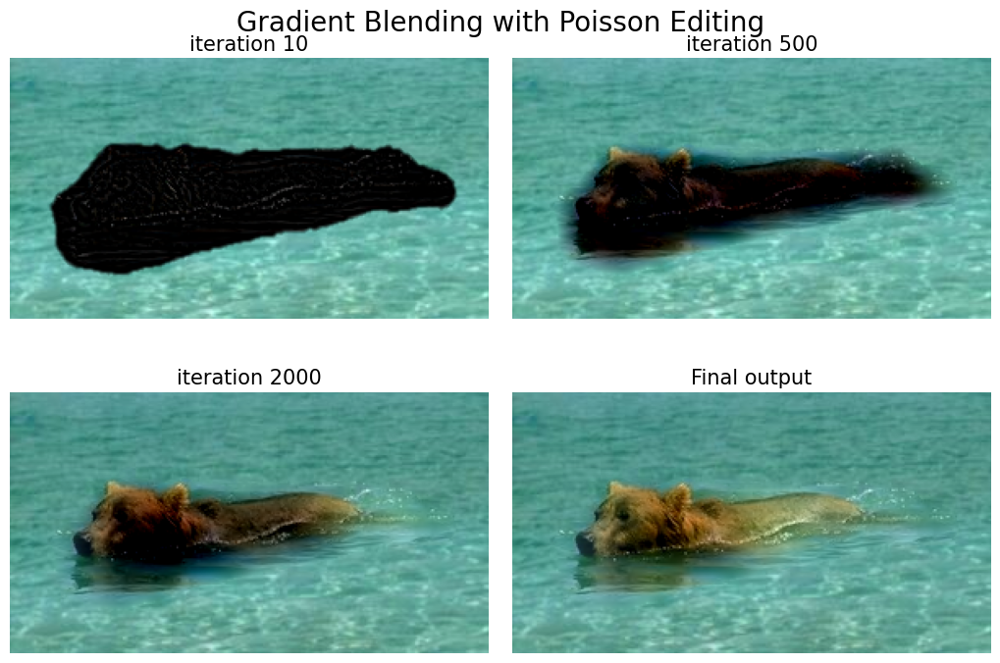

In [23]:
import os
from scipy import sparse

col = None	
def callback2(xk): 
    global niter, w, h, col
    I = np.reshape(xk, (w,h))
    plt.imshow(I*255)
    plt.show()
    niter += 1
    print (niter)
    
def poisson_editing_color(src, target, mask):

    global w, h, col, niter
    
    S = cv2.imread(src)
    T = cv2.imread(target)
    M = cv2.imread(mask, 0)
    
    plt.figure(figsize=(10,4))
    plt.subplot(131), plt.imshow(cv2.cvtColor(S, cv2.COLOR_BGR2RGB), aspect='auto'), plt.axis('off'), plt.title('source', size=15)
    plt.subplot(132), plt.imshow(cv2.cvtColor(T, cv2.COLOR_BGR2RGB), aspect='auto'), plt.axis('off'), plt.title('target', size=15)
    plt.subplot(133), plt.imshow(M, cmap='gray', aspect='auto'), plt.axis('off'), plt.title('mask', size=15)
    plt.suptitle('Gradient blending with Poisson Editing', size=18)
    plt.tight_layout()
    plt.show()
    
    S, T, M = S.astype(np.float64) / 255, T.astype(np.float64) / 255, M.astype(np.float64) / 255
    
    (w, h, d) = S.shape
    b = np.zeros((w*h, d))

    row, col, data = [], [], []
    for x in range(w):
        for y in range(h):
            if M[x,y] > 0: # == 1:
                c = 0
                s, t = np.zeros(d, dtype=np.float64), np.zeros(d, dtype=np.float64)
                if y < h-1: 
                    row.append(h*x+y)
                    col.append(h*x+y+1)
                    data.append(1)
                    #A[h*x+y, h*x+y+1] = 1   
                    s += S[x,y+1,:] 
                    t += T[x,y+1,:] 
                    c += 1
                if y > 0:   
                    row.append(h*x+y)
                    col.append(h*x+y-1)
                    data.append(1)
                    #A[h*x+y, h*x+y-1] = 1   
                    s += S[x,y-1,:] 
                    t += T[x,y-1,:] 
                    c += 1
                if x < w-1: 
                    row.append(h*x+y)
                    col.append(h*(x+1)+y)
                    data.append(1)
                    #A[h*x+y, h*(x+1)+y] = 1
                    s += S[x+1,y,:]
                    t += T[x+1,y,:]
                    c += 1
                if x > 0:   
                    row.append(h*x+y)
                    col.append(h*(x-1)+y)
                    data.append(1)
                    #A[h*x+y, h*(x-1)+y] = 1 
                    s += S[x-1,y,:] 
                    t += T[x-1,y,:] 
                    c += 1
                row.append(h*x+y)
                col.append(h*x+y)
                data.append(-c)
                #A[h*x+y, h*x+y] = -c
                s += -c*S[x,y,:]
                t += -c*T[x,y,:]
                #print s, t
                b[h*x+y,:] = s
                # mixed
                #for dim in range(d):
                #   b[h*x+y, dim] = s[dim] if abs(s[dim]) > abs(t[dim]) else t[dim]
            else:
                row.append(h*x+y)
                col.append(h*x+y)
                data.append(1)
                #A[h*x+y, h*x+y] = 1 
                b[h*x+y,:] = T[x,y,:]

    A = sparse.coo_matrix((data, (row, col)), shape=(w*h, w*h), dtype=np.int8) # empty matrix
    I = np.zeros((w, h, d))
    maxiter = 60
    plt.figure(figsize=(10,7))
    plt.subplots_adjust(0,0,1,0.95,0.05,0.05)
    i = 1
    for iter in [10, 500, 2000, None]:
        for dim in range(d):
            I[:,:,dim] = np.reshape(sparse.linalg.lsqr(A, b[:,dim], iter_lim=iter)[0], (w,h))
        I[I < 0] = 0
        plt.subplot(2,2,i), plt.imshow(cv2.cvtColor((255*I / I.max()).astype(np.uint8), cv2.COLOR_BGR2RGB)), plt.axis('off')
        plt.title('iteration {}'.format(iter) if iter else 'Final output', size=15)
        i += 1
    plt.suptitle('Gradient Blending with Poisson Editing', size=20)
    plt.show()
        
##http://onsmith.web.unc.edu/assignment-2/	
src = 'images/bear.png'     
target = 'images/waterpool.png'
mask = 'images/bear_mask.png' 
poisson_editing_color(src, target, mask)

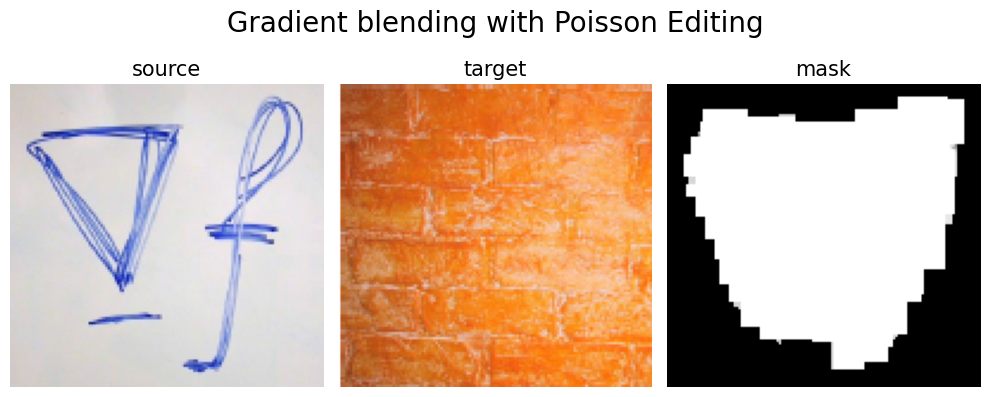

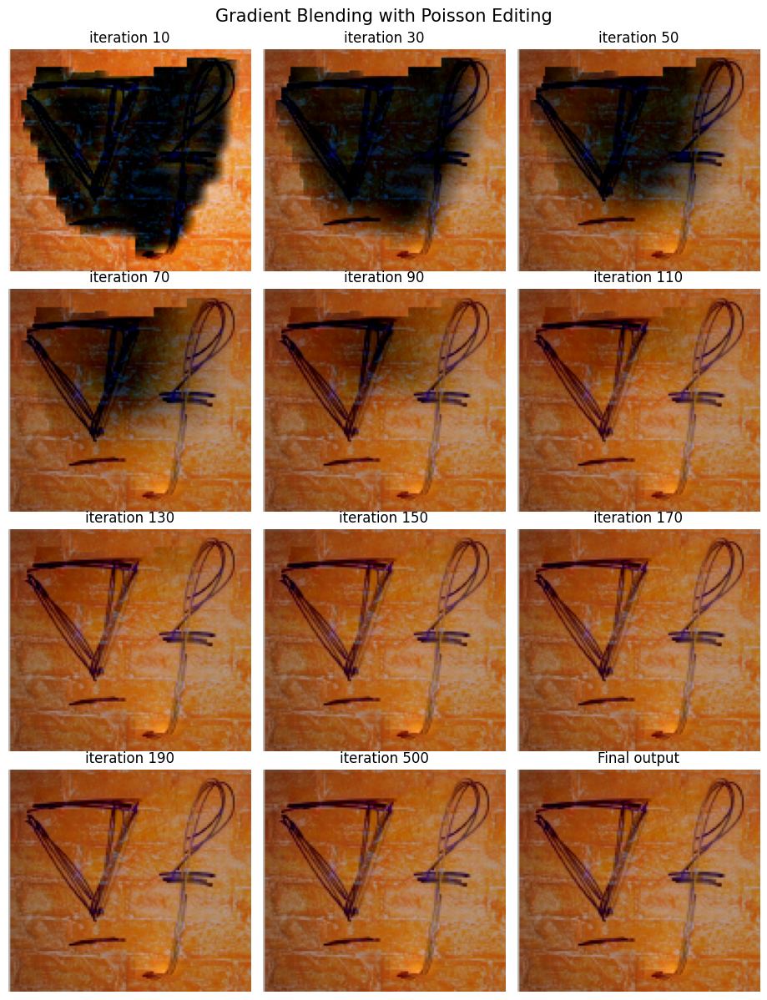

In [21]:
def poisson_editing_color_mix(src, target, mask):

    global w, h, col, niter
    
    S = cv2.imread(src)
    T = cv2.imread(target)
    M = cv2.imread(mask, 0)
    
    plt.figure(figsize=(10,4))
    plt.subplot(131), plt.imshow(cv2.cvtColor(S, cv2.COLOR_BGR2RGB), aspect='auto'), plt.axis('off'), plt.title('source', size=15)
    plt.subplot(132), plt.imshow(cv2.cvtColor(T, cv2.COLOR_BGR2RGB), aspect='auto'), plt.axis('off'), plt.title('target', size=15)
    plt.subplot(133), plt.imshow(M, cmap='gray', aspect='auto'), plt.axis('off'), plt.title('mask', size=15)
    plt.suptitle('Gradient blending with Poisson Editing', size=20)
    plt.tight_layout()
    plt.show()
    
    S, T, M = S.astype(np.float64) / S.max(), T.astype(np.float64) / T.max(), M.astype(np.float64) / M.max()
    
    (w, h, d) = S.shape
    b = np.zeros((2*w*h, d))

    row, col, data = [], [], []
    for x in range(w):
        for y in range(h):
            if M[x,y] > 0: # == 1:
                s, t = np.zeros((2,d), dtype=np.float64), np.zeros((2,d), dtype=np.float64)
                if x < w-1: 
                    row.append(2*(h*x+y))
                    col.append(h*(x+1)+y)
                    data.append(1)
                    row.append(2*(h*x+y))
                    col.append(h*x+y)
                    data.append(-1)
                    s[0,:] = S[x+1,y,:] - S[x,y,:]
                    t[0,:] = T[x+1,y,:] - T[x,y,:]
                else:   
                    row.append(2*(h*x+y))
                    col.append(h*x+y)
                    data.append(1)
                    row.append(2*(h*x+y))
                    col.append(h*(x-1)+y)
                    data.append(-1)
                    s[0,:] = S[x,y,:] - S[x-1,y,:]
                    t[0,:] = T[x,y,:] - T[x-1,y,:]
                if y < h-1: 
                    row.append(2*(h*x+y)+1)
                    col.append(h*x+y+1)
                    data.append(1)
                    row.append(2*(h*x+y)+1)
                    col.append(h*x+y)
                    data.append(-1)
                    s[1,:] = S[x,y+1,:] - S[x,y,:]
                    t[1,:] = T[x,y+1,:] - T[x,y,:]
                else:   
                    row.append(2*(h*x+y)+1)
                    col.append(h*x+y)
                    data.append(1)
                    row.append(2*(h*x+y)+1)
                    col.append(h*x+y-1)
                    data.append(-1)
                    s[1,:] = S[x,y,:] - S[x,y-1,:]
                    t[1,:] = T[x,y,:] - T[x,y-1,:]
                # mixed gradient
                for dim in range(d):				
                    b[2*(h*x+y), dim] = s[0,dim] if sum(s[:,dim]**2) > sum(t[:,dim]**2) else t[0,dim]
                    b[2*(h*x+y)+1, dim] = s[1,dim] if sum(s[:,dim]**2) > sum(t[:,dim]**2) else t[1,dim]
            else:
                row.append(2*(h*x+y))
                col.append(h*x+y)
                data.append(1)
                b[2*(h*x+y),:] = T[x,y,:]

    A = sparse.coo_matrix((data, (row, col)), shape=(2*w*h, w*h), dtype=np.int8) # empty matrix
    I = np.zeros((w, h, d))
    plt.figure(figsize=(9,15))
    plt.subplots_adjust(0,0,1,0.95,0.05,0.05)
    i = 1
    for iter in list(range(10, 200, 20)) + [500, None]:
        for dim in range(d):
            I[:,:,dim] = np.reshape(sparse.linalg.lsqr(A, b[:,dim], iter_lim=iter)[0], (w,h))
        I[I < 0] = 0
        plt.subplot(5,3,i), plt.imshow(cv2.cvtColor((255*I / I.max()).astype(np.uint8), cv2.COLOR_BGR2RGB)), plt.axis('off')
        plt.title('iteration {}'.format(iter) if iter else 'Final output', size=12)
        i += 1
    plt.suptitle('Gradient Blending with Poisson Editing', size=15)
    plt.show()

poisson_editing_color_mix('images/grad.png', 'images/bricks.png', 'images/grad_mask.png')

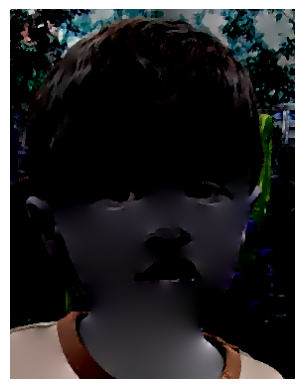

In [28]:
def texture_flattening(src, mask):
    global w, h, col, niter

    S = cv2.imread(src).astype(np.float64) / 255
    M =  cv2.imread(mask, 0).astype(np.float64) / 255 #+ 0.4
    (w, h, d) = S.shape
    b = np.zeros((2*w*h, d))

    row, col, data = [], [], []
    for x in range(w):
        for y in range(h):
            s, t = np.zeros((2,d), dtype=np.float64), np.zeros((2,d), dtype=np.float64)
            if x < w-1: 
                row.append(2*(h*x+y))
                col.append(h*(x+1)+y)
                data.append(1)
                row.append(2*(h*x+y))
                col.append(h*x+y)
                data.append(-1)
                #print(x, y)
                s[0,:] = M[x,y] * (S[x+1,y,:] - S[x,y,:])
            else:   
                row.append(2*(h*x+y))
                col.append(h*x+y)
                data.append(1)
                row.append(2*(h*x+y))
                col.append(h*(x-1)+y)
                data.append(-1)
                s[0,:] = M[x,y] * (S[x,y,:] - S[x-1,y,:])
            if y < h-1: 
                row.append(2*(h*x+y)+1)
                col.append(h*x+y+1)
                data.append(1)
                row.append(2*(h*x+y)+1)
                col.append(h*x+y)
                data.append(-1)
                s[1,:] =  M[x,y] * (S[x,y+1,:] - S[x,y,:])
            else:   
                row.append(2*(h*x+y)+1)
                col.append(h*x+y)
                data.append(1)
                row.append(2*(h*x+y)+1)
                col.append(h*x+y-1)
                data.append(-1)
                s[1,:] =  M[x,y] * (S[x,y,:] - S[x,y-1,:])
            #print s, t
            # mixed gradient
            for dim in range(d):
                b[2*(h*x+y), dim] = s[0,dim]
                b[2*(h*x+y)+1, dim] = s[1,dim]

    A = sparse.coo_matrix((data, (row, col)), shape=(2*w*h, w*h), dtype=np.int8) # empty matrix
    I = np.zeros((w, h, d))
    for dim in range(d):
        I[:,:,dim] = np.reshape(sparse.linalg.lsqr(A, b[:,dim])[0], (w,h))
    I[I < 0] = 0
    plt.imshow(I / I.max()) #cv2.cvtColor((255*I/I.max()).astype(np.uint8), cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

texture_flattening('images/face1.png', 'images/mface1.png')

In [ ]:
import numpy as np
import cv2
from scipy.sparse import spdiags
from scipy.sparse.linalg import spsolve

def poisson_blend(source, target, mask, offset=(0, 0)):
    y_max, x_max = target.shape[:2]
    y_min, x_min = offset
    y_max = min(y_max, y_min + source.shape[0])
    x_max = min(x_max, x_min + source.shape[1])

    # Extract the region of interest
    target_roi = target[y_min:y_max, x_min:x_max]
    mask_roi = mask[y_min:y_max, x_min:x_max]
    source_roi = source[:y_max-y_min, :x_max-x_min]

    # Compute gradients
    grad_x = cv2.Sobel(source_roi, cv2.CV_64F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(source_roi, cv2.CV_64F, 0, 1, ksize=3)

    # Flatten the gradients
    grad_x = grad_x.flatten()
    grad_y = grad_y.flatten()

    h, w = target_roi.shape[:2]
    e = np.ones(h * w)
    diag_data = np.array([-4 * e, e, e, e, e])
    offsets = np.array([0, -1, 1, -w, w])
    laplacian = spdiags(diag_data, offsets, h * w, h * w)

    div = np.zeros(h * w)
    div[0::w] += grad_x[0::w]
    div[1::w] -= grad_x[0::w]
    div[0:w] += grad_y[0:w]
    div[w:] -= grad_y[0:w]

    img_flat = spsolve(laplacian, div)
    img = img_flat.reshape((h, w))

    # Blend the reconstructed image with the target image
    blended = target.copy()
    blended[y_min:y_max, x_min:x_max] = img * mask_roi + target_roi * (1 - mask_roi)

    return blended

# Load images
source = cv2.imread('images/source.png', cv2.IMREAD_COLOR).astype(np.float32) / 255.0
target = cv2.imread('target.png', cv2.IMREAD_COLOR).astype(np.float32) / 255.0
mask = cv2.imread('mask.png', cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0

# Perform Poisson blending
blended_img = poisson_blend(source, target, mask, offset=(50, 50))

# Display the result
plt.imshow(blended_img)
plt.axis('off')
plt.show()

## 4. Motion Estimation and Optical Flow

In [ ]:
import cv2
import os

def extract_frames(vid, out, n=1):
    os.makedirs(out, exist_ok=True)
    vidcap = cv2.VideoCapture(vid)
    success,image = vidcap.read()
    count = 0
    success = True
    while success:
      success,image = vidcap.read()
      if count % n == 0:
          print('Read a new frame: ', success)
          cv2.imwrite("{}/frame_{:03d}.png".format(out,count), image)     # save frame as JPEG file
      count += 1

extract_frames('images/traffic1.mp4', 'images/traffic1', 2) 

## 4.1 Horn and Schunck variatonal approach

In [1]:
from scipy.signal import convolve2d
from skimage.io import imread
import numpy as np
import matplotlib.pylab as plt
import warnings
warnings.filterwarnings('ignore')

#compute derivatives of the image intensity values along the x, y, time
def convolve(im, kernel):
    return convolve2d(im, kernel, boundary='symm', mode='same')

def get_derivatives(im1, im2):
    #derivative masks
    dx_kernel = np.array([[-1., 1.], [-1., 1.]]) / 4
    dy_kernel = np.array([[-1., -1.], [1., 1.]]) / 4
    dt_kernel = np.array([[1., 1.], [1., 1.]]) / 4
    f_x = convolve(im1, dx_kernel) + convolve(im2, dx_kernel)
    f_y = convolve(im1, dy_kernel) + convolve(im2, dx_kernel)
    f_t = convolve(im2, dt_kernel) + convolve(im1, -dt_kernel)
    return (f_x, f_y, f_t)

def get_gaussian_kernel(k=2):
    g1 = np.array([np.exp(-x**2)/np.sqrt(2*np.pi) for x in range(-k, k+1)])
    gauss_kernel = np.outer(g1, g1)
    return gauss_kernel / np.sum(gauss_kernel)    

converged after iteration 187


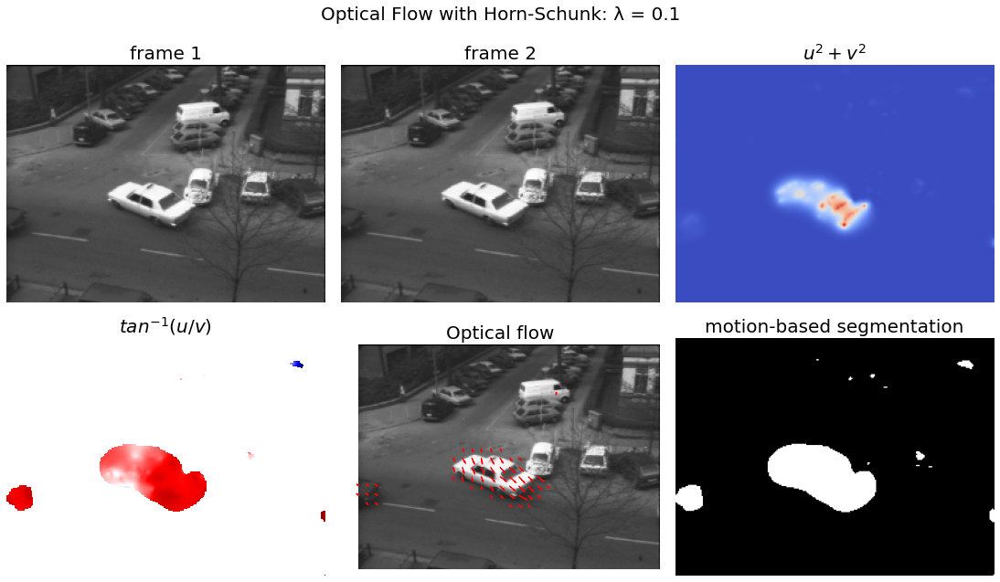

In [3]:
def horn_schunk(im1, im2, λ, ε=1e-1):
    
    im1, im2 = im1 / im1.max(), im2 / im2.max()
    #removing noise
    gauss_kernel = get_gaussian_kernel()
    im1, im2  = convolve(im1, gauss_kernel), convolve(im2, gauss_kernel) #cv2.GaussianBlur(im1, (5, 5), 0)
    
    # set up initial values
    u, v = np.zeros_like(im1), np.zeros_like(im1)
    f_x, f_y, f_t = get_derivatives(im1, im2)
    avg_kernel = np.array([[0, 1 / 4, 0],
                            [1 / 4, 0, 1 / 4],
                            [0, 1 / 4, 0]], float)
    itr = 0
    d = λ + f_x**2 + f_y**2
    while True:
        u_avg, v_avg = convolve(u, avg_kernel), convolve(v, avg_kernel)
        p = f_x * u_avg + f_y * v_avg + f_t
        u_prev, v_prev = u, v
        α = p / d
        u = u_avg - f_x * α
        v = v_avg - f_y * α
        diff = np.linalg.norm((u - u_prev)) + np.linalg.norm((v - v_prev))
        #converges check (at most 300 iterations)
        if  diff < ε or itr > 300:
            print(f"converged after iteration {itr}")
            break
        itr += 1

    return u, v

def plot_images(u, v, im1, im2, λ, ε=1, scale=5): #1/5
    
    u, v = u*scale, v*scale
    mag, dr = u**2 + v**2, np.arctan(u/v)
    avg_mag = np.mean(mag)
    #print(np.nanmin(mag), np.nanmax(mag))
    dr[mag < avg_mag] = np.nan
    #dr[mag < ε] = np.nan

    plt.figure(figsize=(15,9))
    plt.subplots_adjust(0,0,1,0.9,0.05,0.05)
    plt.subplot(231); plt.axis('off'); plt.imshow(im1, cmap='gray'); plt.title('frame 1', fontsize=20)
    plt.subplot(232); plt.axis('off'); plt.imshow(im2, cmap='gray'); plt.title('frame 2', fontsize=20)
    plt.subplot(233); plt.axis('off'); plt.imshow(mag, cmap='coolwarm'); plt.title(r'$u^2+v^2$', fontsize=20)
    plt.subplot(234); plt.axis('off'); plt.imshow(dr, cmap='seismic'); plt.title(r'$tan^{-1}(u/v)$', fontsize=20)
    plt.subplot(235), plt.axis('off'), plt.imshow(im2, cmap='gray'), plt.title('Optical flow', fontsize=20)
    # draw the velocity vectors
    s = 8
    for i in range(0, u.shape[0], s):
        for j in range(0, u.shape[1],s):
            dx, dy = u[i,j], v[i,j]
            mag = np.sqrt(dx**2 + dy**2)
            #draw only significant changes
            if mag > avg_mag:
                plt.arrow(j,i, dx, dy, head_width=1, head_length=2, color = 'red')
    # motion segment
    plt.subplot(236), plt.axis('off')
    motion = np.zeros(u.shape)
    #motion[mag > ε] = 1 
    mag, dr = u**2 + v**2, np.arctan(u/v)
    motion[mag > np.mean(mag)] = 1
    motion = gray2rgb(motion) if im2.ndim == 3 else motion
    #plt.imshow(0.1*im2 + 0.9*motion, cmap='coolwarm'),  plt.title('motion segmentation', fontsize=20)
    plt.imshow(motion, cmap='gray'),  plt.title('motion-based segmentation', fontsize=20)
    plt.suptitle(f'Optical Flow with Horn-Schunk: λ = {λ}', size=20)
    plt.show()
    
im1, im2 = imread('images/hamburg_taxi/taxi01.pgm', as_gray=True), imread('images//hamburg_taxi/taxi02.pgm', as_gray=True)
λ = 0.1 # 1
u, v = horn_schunk(im1, im2, λ)
plot_images(u, v, im1, im2, λ)

converged after iteration 301


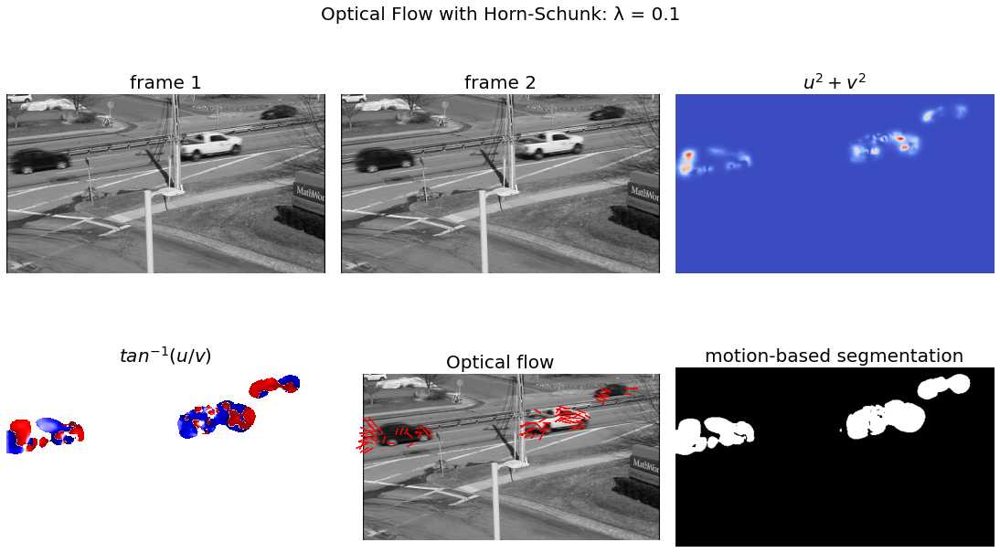

In [7]:
im1, im2 = imread('images/frame_0361.jpg', as_gray=True), imread('images/frame_0362.jpg', as_gray=True)
λ = 0.1 # 1
u, v = horn_schunk(im1, im2, λ)
plot_images(u, v, im1, im2, λ)

In [ ]:
import cv2
import numpy as np

def horn_schunck_optical_flow(prev_img, next_img, alpha=0.001, num_iterations=100):
    prev_gray = cv2.cvtColor(prev_img, cv2.COLOR_BGR2GRAY)
    next_gray = cv2.cvtColor(next_img, cv2.COLOR_BGR2GRAY)

    # Initialize flow vectors
    u = np.zeros(prev_gray.shape)
    v = np.zeros(prev_gray.shape)

    # Compute image gradients
    Ix = cv2.Sobel(prev_gray, cv2.CV_64F, 1, 0, ksize=5)
    Iy = cv2.Sobel(prev_gray, cv2.CV_64F, 0, 1, ksize=5)
    It = next_gray - prev_gray

    # Iterative update of flow vectors
    for _ in range(num_iterations):
        u_avg = cv2.blur(u, (5, 5))
        v_avg = cv2.blur(v, (5, 5))

        P = Ix * u_avg + Iy * v_avg + It
        D = alpha**2 + Ix**2 + Iy**2

        u = u_avg - Ix * (P / D)
        v = v_avg - Iy * (P / D)

    # Visualizing the flow
    hsv = np.zeros_like(prev_img)
    hsv[..., 1] = 255

    mag, ang = cv2.cartToPolar(u, v)
    hsv[..., 0] = ang * 180 / np.pi / 2
    hsv[..., 2] = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)

    flow_img = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    return flow_img

# Example usage
if __name__ == "__main__":
    cap = cv2.VideoCapture('video.mp4')
    ret, prev_frame = cap.read()
    while cap.isOpened():
        ret, next_frame = cap.read()
        if not ret:
            break
        flow_img = horn_schunck_optical_flow(prev_frame, next_frame)
        cv2.imshow('Horn-Schunck Optical Flow', flow_img)
        if cv2.waitKey(30) & 0xFF == ord('q'):
            break
        prev_frame = next_frame
    cap.release()
    cv2.destroyAllWindows()

## 4.2 Lucas and Kanade least-squares approach

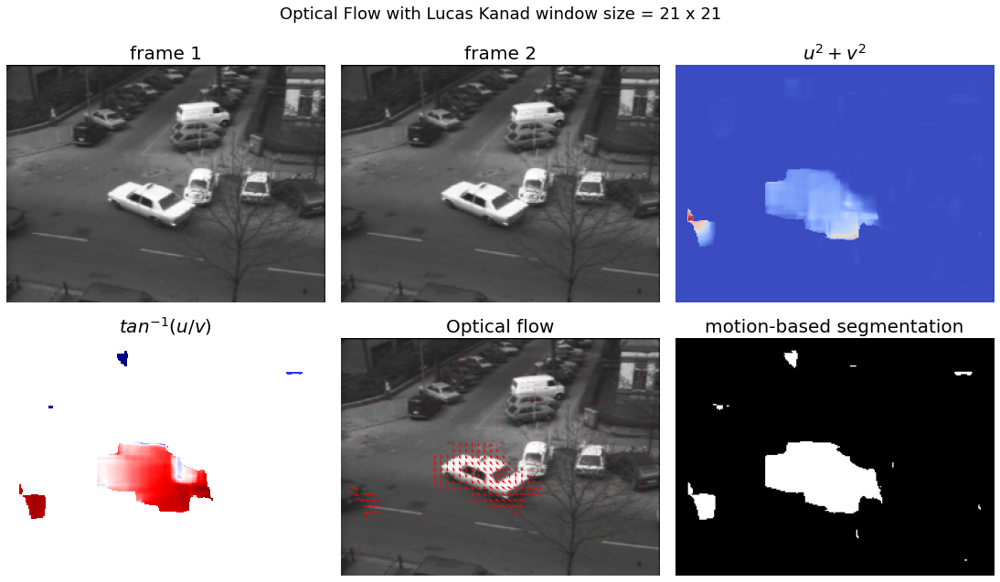

In [2]:
from skimage.filters import threshold_otsu
from skimage.color import rgb2gray, gray2rgb
from glob import glob

def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.299, 0.587, 0.114])
    #return np.mean(rgb, axis=2)
    
def lucas_kanade(im1, im2, window_size=11, ε=1e-2): # 25

    #removing noise
    gauss_kernel = get_gaussian_kernel(k=2)
    im1, im2  = convolve(im1, gauss_kernel), convolve(im2, gauss_kernel) #cv2.GaussianBlur(im1, (5, 5), 0)
    
    im1_g = rgb2gray(im1) if len(im1.shape) == 3 else im1
    im2_g = rgb2gray(im2) if len(im2.shape) == 3 else im2
    im1_g, im2_g = im1_g / im1_g.max(), im2_g / im2_g.max()

    # Lucas Kanade Here
    # set up initial values
    # for each point, calculate f_x, f_y, f_t
    u, v = np.zeros_like(im1_g), np.zeros_like(im1_g)
    f_x, f_y, f_t = get_derivatives(im1_g, im2_g)
    
    w = window_size//2
    
    # within window window_size * window_size
    for i in range(w, im1_g.shape[0]-w):
        for j in range(w, im1_g.shape[1]-w):

            f_x_w = f_x[i-w:i+w+1, j-w:j+w+1].flatten()
            f_y_w = f_y[i-w:i+w+1, j-w:j+w+1].flatten()
            f_t_w = f_t[i-w:i+w+1, j-w:j+w+1].flatten()

            b = np.reshape(f_t_w, (-1,1)) # get b here #-
            A = np.vstack((f_x_w, f_y_w)).T # get A here

            #print np.min(np.linalg.eigvals(np.matmul(A.T, A)))
            if np.min(abs(np.linalg.eigvals(np.matmul(A.T, A)))) >= ε:
                u[i,j], v[i,j] = np.matmul(np.linalg.pinv(A), b) # get velocity here

    return u, v
    
def plot_images(u, v, im1, im2, window_size=11, ε=1e-2, scale=1): #1/5
    
    u, v = u*scale, v*scale
    mag, dr = u**2 + v**2, np.arctan(u/v)
    avg_mag = np.mean(mag)
    #print(np.nanmin(mag), np.nanmax(mag))
    dr[mag < avg_mag] = np.nan
    #dr[mag < ε] = np.nan

    plt.figure(figsize=(15,9))
    plt.subplots_adjust(0,0,1,0.9,0.05,0.05)
    plt.subplot(231); plt.axis('off'); plt.imshow(im1, cmap='gray'); plt.title('frame 1', fontsize=20)
    plt.subplot(232); plt.axis('off'); plt.imshow(im2, cmap='gray'); plt.title('frame 2', fontsize=20)
    plt.subplot(233); plt.axis('off'); plt.imshow(mag, cmap='coolwarm'); plt.title(r'$u^2+v^2$', fontsize=20)
    plt.subplot(234); plt.axis('off'); plt.imshow(dr, cmap='seismic'); plt.title(r'$tan^{-1}(u/v)$', fontsize=20)
    
    s = 5 #5 #10
    # downsize u and v
    u_deci = np.zeros(u.shape)
    v_deci = np.zeros(v.shape)
    for i in range(0,u.shape[0],s):
        for j in range(0,u.shape[1],s):
            u_deci[i,j], v_deci[i,j] = u[i,j], v[i,j]
    # get coordinate for u and v in the original frame
    X_deci, Y_deci = np.meshgrid(range(u.shape[1]), range(u.shape[0]))
    u_deci[abs(u_deci) < ε] = np.nan
    v_deci[abs(v_deci) < ε] = np.nan

    plt.subplot(235), plt.axis('off'), plt.imshow(im2, cmap='gray'), plt.title('Optical flow', fontsize=20)
    # draw the velocity vectors
    plt.quiver(X_deci, Y_deci, u_deci, v_deci, pivot='mid', units='xy', angles='xy', scale_units='xy', scale=.25, color='r')#, units='width')
    # motion segment
    plt.subplot(236), plt.axis('off')
    motion = np.zeros(u.shape)
    #motion[mag > ε] = 1
    motion[mag > avg_mag] = 1.
    #thres = threshold_otsu(mag)
    #motion[mag > thres] = 1.
    motion = gray2rgb(motion) if im2.ndim == 3 else motion
    #plt.imshow(0.1*im2 + 0.9*motion, cmap='coolwarm'),  plt.title('motion segmentation', fontsize=20)
    plt.imshow(motion, cmap='gray'),  plt.title('motion-based segmentation', fontsize=20)
    plt.suptitle(f'Optical Flow with Lucas Kanad window size = {window_size} x {window_size}', size=18)
    plt.show()

im1, im2 = imread('images/hamburg_taxi/taxi01.pgm', as_gray=True), imread('images//hamburg_taxi/taxi02.pgm', as_gray=True)
window_size = 21
u, v = lucas_kanade(im1, im2, window_size)
plot_images(u, v, im1, im2, window_size)

## 4.3 Farneback Optical Flow Approach

In [ ]:
import cv2
import numpy as np

def farneback_optical_flow(prev_img, next_img):
    prev_gray = cv2.cvtColor(prev_img, cv2.COLOR_BGR2GRAY)
    next_gray = cv2.cvtColor(next_img, cv2.COLOR_BGR2GRAY)

    # Calculating dense optical flow using Farneback method
    flow = cv2.calcOpticalFlowFarneback(prev_gray, next_gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)

    # Visualizing the flow
    hsv = np.zeros_like(prev_img)
    hsv[..., 1] = 255

    mag, ang = cv2.cartToPolar(flow[..., 0], flow[..., 1])
    hsv[..., 0] = ang * 180 / np.pi / 2
    hsv[..., 2] = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)

    flow_img = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    return flow_img

# Example usage
if __name__ == "__main__":
    cap = cv2.VideoCapture('video.mp4')
    ret, prev_frame = cap.read()
    while cap.isOpened():
        ret, next_frame = cap.read()
        if not ret:
            break
        flow_img = farneback_optical_flow(prev_frame, next_frame)
        cv2.imshow('Farneback Optical Flow', flow_img)
        if cv2.waitKey(30) & 0xFF == ord('q'):
            break
        prev_frame = next_frame
    cap.release()
    cv2.destroyAllWindows()

## 7. Image Reconstruction and Inpainting with Randomized Algorithm Patchmatch

In [ ]:
import numpy as np
from PIL import Image
import time
import os
import cv2
from skimage.color import lab2rgb, rgb2lab, rgb2gray
import matplotlib.pylab as plt

def get_bbox(mask):
    '''
    Obtain bounding box for mask
    '''

    bbox = {}
    bbox["h_min"] = np.min( np.where(mask == 1)[0])
    bbox["w_min"] = np.min( np.where(mask == 1)[1])
    bbox["h_max"] = np.max( np.where(mask == 1)[0])
    bbox["w_max"] = np.max( np.where(mask == 1)[1])

    return bbox

def get_mask(masked_image):
    mask = np.zeros_like(masked_image)
    mask[(masked_image[...,0]==255) & (masked_image[...,1]==0) & (masked_image[...,1]==0)] = 255
    return mask

def cal_distance(a, b, A_padding, B, p_size):
    p = p_size // 2
    patch_a = A_padding[a[0]:a[0] + p_size, a[1]:a[1] + p_size, :]
    patch_b = B[b[0] - p:b[0] + p + 1, b[1] - p:b[1] + p + 1, :]
    temp = patch_b - patch_a
    num = np.sum(1 - np.int32(np.isnan(temp)))
    dist = np.sum(np.square(np.nan_to_num(temp))) / num
    return dist

def reconstruction(f, A, B):
    A_h = np.size(A, 0)
    A_w = np.size(A, 1)
    temp = np.zeros_like(A)
    for i in range(A_h):
        for j in range(A_w):
            temp[i, j, :] = B[f[i, j][0], f[i, j][1], :]
    return Image.fromarray((temp * 255).astype(np.uint8))

def initialization(A, B, p_size):
    A_h = np.size(A, 0)
    A_w = np.size(A, 1)
    B_h = np.size(B, 0)
    B_w = np.size(B, 1)
    p = p_size // 2
    random_B_r = np.random.randint(p, B_h - p, [A_h, A_w])
    random_B_c = np.random.randint(p, B_w - p, [A_h, A_w])
    A_padding = np.ones([A_h + p * 2, A_w + p * 2, 3]) * np.nan
    A_padding[p:A_h + p, p:A_w + p, :] = A
    f = np.zeros([A_h, A_w], dtype=object)
    dist = np.zeros([A_h, A_w])
    for i in range(A_h):
        for j in range(A_w):
            a = np.array([i, j])
            b = np.array([random_B_r[i, j], random_B_c[i, j]], dtype=np.int32)
            f[i, j] = b
            dist[i, j] = cal_distance(a, b, A_padding, B, p_size)
    return f, dist, A_padding

def propagation(f, a, dist, A_padding, B, p_size, is_odd):
    A_h = np.size(A_padding, 0) - p_size + 1
    A_w = np.size(A_padding, 1) - p_size + 1
    x = a[0]
    y = a[1]
    if is_odd:
        d_left = dist[max(x - 1, 0), y]
        d_up = dist[x, max(y - 1, 0)]
        d_current = dist[x, y]
        idx = np.argmin(np.array([d_current, d_left, d_up]))
        if idx == 1:
            f[x, y] = f[max(x - 1, 0), y]
            dist[x, y] = cal_distance(a, f[x, y], A_padding, B, p_size)
        if idx == 2:
            f[x, y] = f[x, max(y - 1, 0)]
            dist[x, y] = cal_distance(a, f[x, y], A_padding, B, p_size)
    else:
        d_right = dist[min(x + 1, A_h - 1), y]
        d_down = dist[x, min(y + 1, A_w - 1)]
        d_current = dist[x, y]
        idx = np.argmin(np.array([d_current, d_right, d_down]))
        if idx == 1:
            f[x, y] = f[min(x + 1, A_h - 1), y]
            dist[x, y] = cal_distance(a, f[x, y], A_padding, B, p_size)
        if idx == 2:
            f[x, y] = f[x, min(y + 1, A_w - 1)]
            dist[x, y] = cal_distance(a, f[x, y], A_padding, B, p_size)


def random_search(f, a, dist, A_padding, B, p_size, alpha=0.5):
    x = a[0]
    y = a[1]
    B_h = np.size(B, 0)
    B_w = np.size(B, 1)
    p = p_size // 2
    i = 4
    search_h = B_h * alpha ** i
    search_w = B_w * alpha ** i
    b_x = f[x, y][0]
    b_y = f[x, y][1]
    while search_h > 1 and search_w > 1:
        search_min_r = max(b_x - search_h, p)
        search_max_r = min(b_x + search_h, B_h - p)
        random_b_x = np.random.randint(search_min_r, search_max_r)
        search_min_c = max(b_y - search_w, p)
        search_max_c = min(b_y + search_w, B_w - p)
        random_b_y = np.random.randint(search_min_c, search_max_c)
        search_h = B_h * alpha ** i
        search_w = B_w * alpha ** i
        b = np.array([random_b_x, random_b_y])
        d = cal_distance(a, b, A_padding, B, p_size)
        if d < dist[x, y]:
            dist[x, y] = d
            f[x, y] = b
        i += 1


def NNS(img, ref, p_size, nitr):
    A_h = np.size(img, 0)
    A_w = np.size(img, 1)
    f, dist, img_padding = initialization(img, ref, p_size)
    iter = 0
    result = reconstruction(f, img, ref)
    for iter in range(1, nitr + 1):
        print("iteration: {}".format(iter))
        if iter % 2 == 0:
            for i in range(A_h - 1, -1, -1):
                for j in range(A_w - 1, -1, -1):
                    a = np.array([i, j])
                    propagation(f, a, dist, img_padding, ref, p_size, False)
                    random_search(f, a, dist, img_padding, ref, p_size)
        else:
            for i in range(A_h):
                for j in range(A_w):
                    a = np.array([i, j])
                    propagation(f, a, dist, img_padding, ref, p_size, True)
                    random_search(f, a, dist, img_padding, ref, p_size)
        result = reconstruction(f, img, ref)
    return result, dist

def plot_image(img, ref, out, annd, title):
    plt.figure(figsize=(10,15))
    plt.gray()
    plt.subplots_adjust(0,0,1,0.925,0.05,0.05)
    plt.subplot(221), plt.imshow(img), plt.title('input', size=20), plt.axis('off')
    plt.subplot(222), plt.imshow(ref), plt.title('reference (to be used for input reconstruction)', size=20), plt.axis('off')
    plt.subplot(223), plt.imshow(annd, cmap='coolwarm'), plt.title('Approx-NN field distances (patch_size=5)', size=20), plt.axis('off')
    plt.subplot(224), plt.imshow(out), plt.title('reconstructed input', size=20), plt.axis('off')
    plt.suptitle(title, size=25)
    plt.show()
    
def run_patchmatch(img, ref, itr):
    img = cv2.resize(np.array(Image.open(img))[...,:3], None, fx=0.5, fy=0.5)
    ref = cv2.resize(np.array(Image.open(ref))[...,:3], None, fx=0.5, fy=0.5)
    img = img / img.max()
    ref = ref / ref.max()
    start = time.time()
    f, annd = NNS(img, ref, p_size, itr)
    end = time.time()
    print(end - start)
    plot_image(img, ref, f, annd, 'Image Reconstruction (PatchMatch): Reconstructed Input from Reference')

p_size = 5 #5 #7 #3
itr = 3
run_patchmatch('images/cat.png', 'images/cat_ref.png', itr)

### Summary

In [ ]:
import cv2
import numpy as np

def initialize_random_patches(source, target_shape):
    h, w, _ = target_shape
    patches = np.zeros((h, w, 2), dtype=np.int32)
    for y in range(h):
        for x in range(w):
            patches[y, x] = [np.random.randint(0, source.shape[0]), np.random.randint(0, source.shape[1])]
    return patches

def compute_patch_distance(source, target, y, x, patch_size, patch):
    dist = 0
    for dy in range(patch_size):
        for dx in range(patch_size):
            sy, sx = patch[0] + dy, patch[1] + dx
            ty, tx = y + dy, x + dx
            if sy < source.shape[0] and sx < source.shape[1] and ty < target.shape[0] and tx < target.shape[1]:
                dist += np.sum((source[sy, sx] - target[ty, tx]) ** 2)
    return dist

def propagate_and_random_search(source, target, patches, patch_size, alpha=0.5):
    h, w, _ = target.shape
    for y in range(h):
        for x in range(w):
            best_patch = patches[y, x]
            best_dist = compute_patch_distance(source, target, y, x, patch_size, best_patch)
            
            # Propagation
            if x > 0:
                left_patch = patches[y, x - 1]
                left_dist = compute_patch_distance(source, target, y, x, patch_size, left_patch)
                if left_dist < best_dist:
                    best_patch, best_dist = left_patch, left_dist
            if y > 0:
                top_patch = patches[y - 1, x]
                top_dist = compute_patch_distance(source, target, y, x, patch_size, top_patch)
                if top_dist < best_dist:
                    best_patch, best_dist = top_patch, top_dist
            
            # Random Search
            search_radius = max(source.shape[0], source.shape[1])
            while search_radius > 1:
                ry = best_patch[0] + np.random.randint(-search_radius, search_radius)
                rx = best_patch[1] + np.random.randint(-search_radius, search_radius)
                if 0 <= ry < source.shape[0] and 0 <= rx < source.shape[1]:
                    random_patch = [ry, rx]
                    random_dist = compute_patch_distance(source, target, y, x, patch_size, random_patch)
                    if random_dist < best_dist:
                        best_patch, best_dist = random_patch, random_dist
                search_radius = int(search_radius * alpha)
            
            patches[y, x] = best_patch
    return patches

def reconstruct_image(source, patches, patch_size):
    h, w, _ = patches.shape
    reconstructed = np.zeros((h, w, 3), dtype=np.uint8)
    for y in range(h):
        for x in range(w):
            patch = patches[y, x]
            reconstructed[y:y+patch_size, x:x+patch_size] = source[patch[0]:patch[0]+patch_size, patch[1]:patch[1]+patch_size]
    return reconstructed

# Example usage
if __name__ == "__main__":
    source_img = cv2.imread('source.jpg')
    target_img = cv2.imread('target.jpg')
    patch_size = 3

    patches = initialize_random_patches(source_img, target_img.shape)
    for _ in range(5):  # Number of iterations
        patches = propagate_and_random_search(source_img, target_img, patches, patch_size)

    result_img = reconstruct_image(source_img, patches, patch_size)
    cv2.imshow('Reconstructed Image', result_img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

### 8. Non-photorealistic Rendering
### 8.1 Stylization Threading

398 377


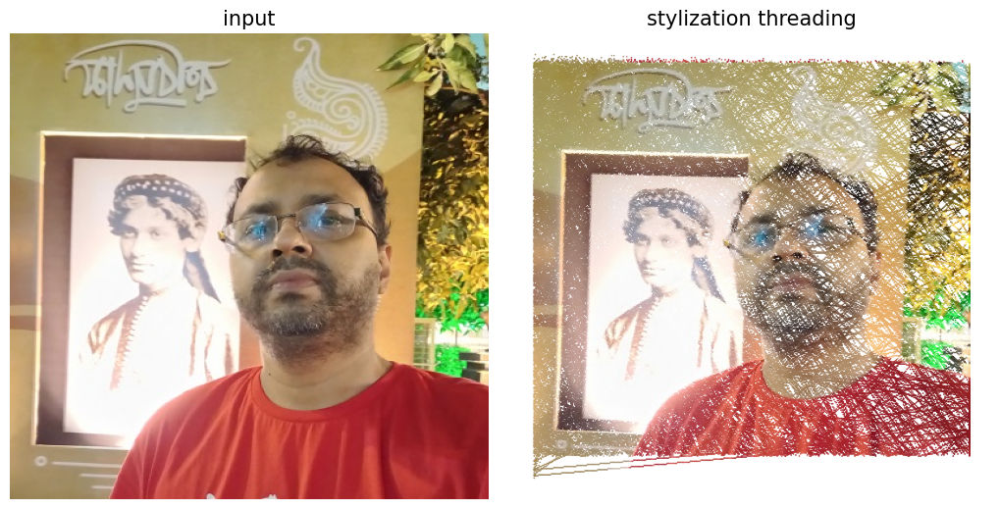

In [34]:
import numpy as np
import matplotlib.pylab as plt

plt.style.use("bmh")
plt.rcParams.update({#"figure.figsize" : (10, 10),
                     "axes.facecolor" : "white",
                     "axes.edgecolor":  "black"})
im = plt.imread('images/me2.jpg')
h, w = im.shape[:-1]
print(h, w)
N = 2500 #5000
ms, cs = np.round(np.random.normal(loc=0, scale=3, size=N), 1), np.round(np.random.normal(loc=0, scale=max(w,h), size=N), 1)
#fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
plt.figure(figsize = (10,5))
plt.subplots_adjust(0,0,1,0.95,0.05,0.05)
plt.subplot(121), plt.imshow(im, aspect='auto'), plt.axis('off'), plt.title('input', size=15)
plt.subplot(122), plt.axis('off'), plt.title('stylization threading', size=15)
for i in range(N):
    m, c = ms[i], cs[i]
    if m == 0: continue
    xs, ys = [], []
    if c >= 0 and c <= h-1:
        xs.append(c), ys.append(0)
    if -c / m >= 0 and -c / m <= w-1:
        xs.append(0), ys.append(-c / m)
    if m * (h-1) + c >= 0 and m * (h-1) + c <= w-1:
        xs.append(m * (h-1) + c), ys.append(h-1)
    if (w-1 - c) / m >= 0 and (w-1 - c) / m <= h-1:
        xs.append(w-1), ys.append((w-1 - c) / m)
    if len(xs) < 2: continue
    #print(m, c)
    xs, ys = ys, xs
    #print(xs, ys)
    inc = 1 if xs[0] <= xs[1] else -1 
    X = np.arange(int(xs[0]), int(xs[1]), inc)
    Y = np.round(m * X + c).astype(int)
    X[X >= w] = w-1
    Y[Y >= h] = h-1
    plt.scatter(X, h-Y, c=im[Y, X]/255, s=0.5, alpha=0.8)
plt.show()

### 8.2 Image Stained Glass with Voronoi Tesellation

In [35]:
import matplotlib.pylab as plt
import numpy as np
from scipy.spatial import Voronoi, voronoi_plot_2d
import scipy.ndimage as ndimage
from matplotlib.path import Path

img = plt.imread('images/girl_color.png')

In [36]:
def stained_glass(img, npoints = 2000):
    print(npoints)
    img = np.transpose(img.copy(), (1,0,2))
    points = [] 
    for i in range(npoints):
        points.append([np.random.uniform(0, img.shape[0]),np.random.uniform(0, img.shape[1])])
    points = np.array(points)
    vor = Voronoi(points)
    #print(len(vor.regions))
    #print(vor.regions)
    x, y = np.meshgrid(np.arange(img.shape[0]), np.arange(img.shape[1])) # make a canvas with coordinates
    x, y = x.flatten(), y.flatten()
    points = np.vstack((x,y)).T 
    #print(points.shape)
    img = ndimage.rotate(img, 90)
    for i in range(len(vor.regions)):
        region = vor.regions[i]
        #print(region)
        if len(region) == 0 or -1 in region: continue
        vertices = [tuple(vor.vertices[v]) for v in region]
        #print(vertices)
        p = Path(vertices) # make a polygon
        grid = p.contains_points(points)
        mask = grid.reshape(img.shape[0],img.shape[1])
        #print(np.max(img))
        img[mask] = np.mean(img[mask], axis=0)
        #print(img[mask])
    return img, vor

In [37]:
npoints = 1000 #2000
stained_glass_img, vor = stained_glass(img, npoints)

1000


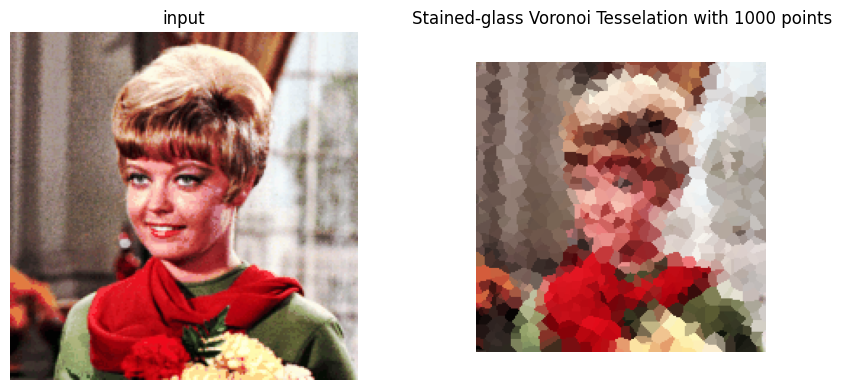

In [42]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9,4))
ax1.imshow(img, aspect='auto'), ax1.axis('off'), ax1.set_title('input', size=12)
ax2.imshow(stained_glass_img, aspect='auto'), ax2.axis('off')
voronoi_plot_2d(vor, point_size=10, show_points=False, show_vertices=False, line_alpha=0, ax=ax2)
ax2.set_title(f'Stained-glass Voronoi Tesselation with {npoints} points', size=12)
plt.tight_layout()
plt.show()

## 8.3 Dithering on Color Images

In [6]:
# http://caca.zoy.org/study/part2.html
# https://www.freepatentsonline.com/5761347.html
import numpy as np
from skimage.io import imread
import matplotlib.pylab as plt
from PIL import Image

In [8]:
def Bayer(n):
    if n == 1:
        return np.array([[0]], dtype=np.uint8)
    else:
        Dn2 = Bayer(n // 2)
        h, w = Dn2.shape
        Dn = np.zeros((2*h, 2*w), dtype=np.uint8)
        Dn[:h, :w] = 4 * Dn2 + 0
        Dn[:h, w:] = 4 * Dn2 + 2
        Dn[h:, :w] = 4 * Dn2 + 3
        Dn[h:, w:] = 4 * Dn2 + 1
        return Dn

def ordered_dither_Bayer(im, k):
    D = Bayer(k)
    #print(D)
    im = ((k**2 - 1) * (im / im.max())).astype(np.uint8)
    h, w = im.shape
    im_out = np.zeros((k * h, k * w), dtype = np.uint8)
    x, y = 0, 0
    for i in range(h):
        for j in range(w):
            im_out[x:x+k, y:y+k] = 255 * (D < im[i, j])
            y = (y + k) % (k*w)
        x = (x + k) % (k*h)
    return im_out

def gcr(im, percentage):
    #  basic "Gray Component Replacement" function. Returns a CMYK image with 
    #  percentage gray component removed from the CMY halftones and put in the
    #  K halftone, ie. for percentage=100, (41, 100, 255, 0) >> (0, 59, 214, 41)
    cmyk_im = im.convert('CMYK')
    if not percentage:
        return cmyk_im
    cmyk_im = cmyk_im.split()
    cmyk = []
    for i in range(4):
        cmyk.append(cmyk_im[i].load())
    for x in range(im.size[0]):
        for y in range(im.size[1]):
            gray = min(cmyk[0][x,y], cmyk[1][x,y], cmyk[2][x,y]) * percentage // 100
            for i in range(3):
                cmyk[i][x,y] = cmyk[i][x,y] - gray
            cmyk[3][x,y] = gray
    return Image.merge('CMYK', cmyk_im)

def color_halftoning_Bayer(cmyk, angles, k):
    out_channels = []    
    for i in range(4):
        out_channel = Image.fromarray(
                            ordered_dither_Bayer(np.asarray(cmyk[i].rotate(angles[i],expand=1)), k)
                      ).rotate(-angles[i], expand=1)
        x = (out_channel.size[0] - cmyk[i].size[0]*k) // 2
        y = (out_channel.size[1] - cmyk[i].size[1]*k) // 2
        out_channel = out_channel.crop((x, y, x + cmyk[i].size[0]*k, y + cmyk[i].size[1]*k))
        out_channels.append(out_channel)
    return Image.merge('CMYK',out_channels)

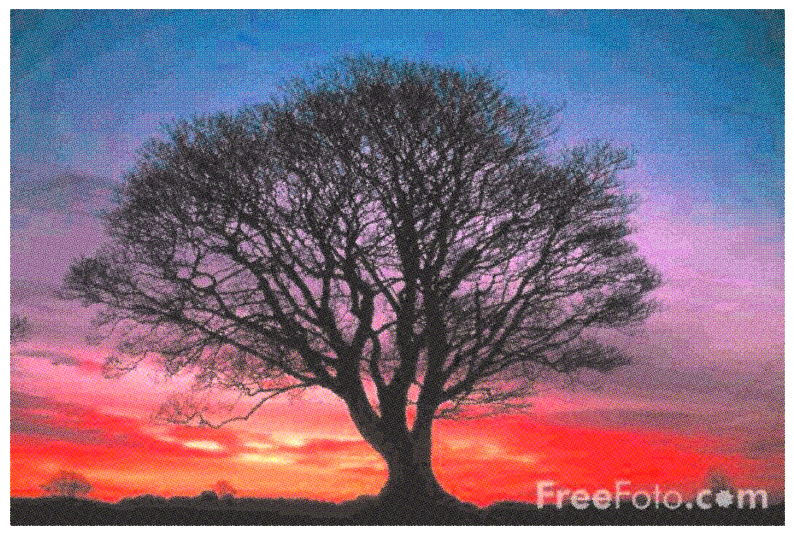

In [9]:
image = Image.open('images/tree.jpg')
cmyk = gcr(image,100).split()   
D4 = np.array([[ 0,  8,  2, 10],
               [12,  4, 14,  6],
               [ 3, 11,  1,  9],
               [15,  7, 13,  5]], dtype=np.uint8)
out = np.asarray(color_halftoning_Bayer(cmyk, np.linspace(15, 60, 4), 4).convert('RGB'))
plt.figure(figsize=(10,10))
plt.imshow(out), plt.axis('off')
plt.show()

## 9. Motion-based Segmentation

In [1]:
from glob import glob
import cv2
import numpy as np
import matplotlib.pylab as plt

In [2]:
def motion_segmentation_ADI(f, T = 0.5, fsz = (10, 32)):

    #threshold T as in equations in the lecture slides regarding ADI

    # initialize absolute ADI, positive ADI and Negative ADI
    # all initialized to zero
    # Note that all ADIs are of the same size with the image
    A = np.zeros(f.shape[:-1])
    P = np.zeros_like(A)
    N = np.zeros_like(A)

    R = f[...,0]
    nrow = f.shape[-1]

    plt.figure(figsize=fsz)
    plt.gray()
    plt.subplots_adjust(0, 0, 1, 0.95, 0.05, 0.05)
    for k in range(f.shape[-1]):
        for x in range(f.shape[0]):
            for y in range(f.shape[1]):
                if abs(R[x,y] - f[x,y,k]) > T:
                    A[x,y] += 1 
                if R[x,y] - f[x,y,k] > T:
                    P[x,y] += 1
                if R[x,y] - f[x,y,k] < -T:
                    N[x,y] += 1
        # The following part will calculate the moving speed 
        # and the total space(in pixel number) occupied by the moving object
        [row, col] = np.where(N > 0)
        s_x = 0 if len(col) == 0 else round((max(col) - y2) / k, 1)
        s_y = 0 if len(row) == 0 else round((max(row) - x2) / k, 1)
        percent_space_occ = int(100*sum(sum(A > 0)) / np.prod(A.shape))
        plt.subplot(nrow,4,4*k+1), plt.imshow(f[...,k]), plt.title(f'input frame, k={k}', size=15), plt.axis('off')
        plt.subplot(nrow,4,4*k+2), plt.imshow(A), plt.title(f'A (space occupied = {percent_space_occ}%)', size=15), plt.axis('off')
        plt.subplot(nrow,4,4*k+3), plt.imshow(P), plt.title(f'P', size=15), plt.axis('off')
        plt.subplot(nrow,4,4*k+4), plt.imshow(N), plt.title(r'N ($s_x=$' +  f'{s_x}' + r', $s_y=$' + f'{s_y})', size=15), plt.axis('off')
    plt.suptitle('Motion segmentation with ADI with abs (A), pos (P) and neg (N) differences', size=20)
    plt.show()

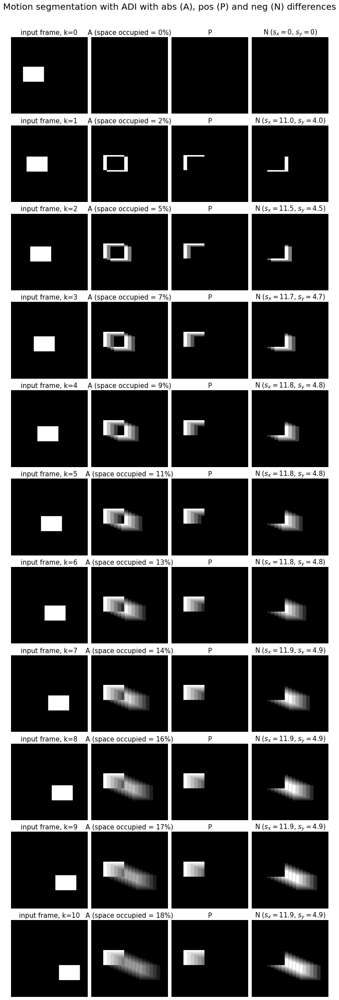

In [3]:
f = np.zeros((256, 256, 11))
x1, y1, x2, y2 = 100, 40, 150, 110
f[x1:x2, y1:y2, 0] = 1
for i in range(1, 11):
    f[x1+5*i:x2+5*i, y1+12*i:y2+12*i, i] = 1

motion_segmentation_ADI(f)

In [10]:
#files = sorted(glob('images/km/*.png'))
#h, w = 1080, 608
#f = np.zeros((h, w, len(files)))
#for i in range(len(files)):
#    f[..., i] = cv2.resize(cv2.imread(files[i], 0), (w, h)) / 255
#f.shape
#motion_segmentation_ADI(f[...,5:15], fsz = (15, 75))

## 10. Motion Estimation with Block-Matching in Videos

In [43]:
import cv2
import numpy as np
from pathlib import Path
import os
import matplotlib.pylab as plt
from matplotlib.gridspec import GridSpec
import pandas as pd
import seaborn as sns
sns.set(font_scale = 2)

In [44]:
def extract_video(vid_path, frate, out_dir):
    
    # Opens the inbuilt camera of laptop to capture video.
    cap = cv2.VideoCapture(vid_path)
    frame_rate = cap.get(5) #frame rate
    print(frame_rate)

    i = 0

    while cap.isOpened():
        frame_id = cap.get(1)
        ret, frame = cap.read()

        # This condition prevents from infinite looping
        # incase video ends.
        if ret == False:
            break

        # Save Frame by Frame into disk using imwrite method
        if (frame_id % (np.floor(frame_rate) // frate) == 0):
            cv2.imwrite('{}/frame_{:04d}.png'.format(out_dir, i), frame)
        i += 1

    cap.release()

In [45]:
Path("images/charlie/").mkdir(exist_ok=True)
extract_video('images/charlie.mp4', 30, "charlie/")

60.0


In [70]:
def plot_frames(target, frame, residual, lt, rb, wsz):
    target = cv2.cvtColor(target, cv2.COLOR_BGR2RGB)
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    id = len(residual)
    fig = plt.figure(constrained_layout=True, figsize=(10,6))
    gs = GridSpec(2, 3, figure=fig)
    ax1 = fig.add_subplot(gs[:2, :2])
    ax1.imshow(frame, aspect='auto')
    for i in range(1,len(lt)):
        (x, y), (x1, y1) = lt[i-1], lt[i]
        dx, dy = x1-x, y1-y
        ax1.arrow(y, x, dy, dx, color='red', head_length = 5, head_width = 3, length_includes_head = True) #linewidth=2, 
    for i in range(1,len(rb)):
        (x, y), (x1, y1) = rb[i-1], rb[i]
        dx, dy = x1-x, y1-y
        ax1.arrow(y, x, dy, dx, color='red', head_length = 5, head_width = 3, length_includes_head = True) #linewidth=2, 
    ax1.set_title(f'frame {id}', size=12)
    ax1.axis('off')
    ax2 = fig.add_subplot(gs[0, 2:])
    ax2.imshow(target, cmap='gray', aspect='auto')
    ax2.set_title('target block', size=12)
    ax2.axis('off')
    ax3 = fig.add_subplot(gs[1, 2:])
    p = sns.barplot(x="frame", y="MSE", data=residual, ax=ax3)
    sns.set(font_scale = 1.2)
    p.set_xticklabels([])
    #p.set_xlabel('frame', fontsize = 12)
    #p.set_ylabel('MSE', fontsize = 12)
    ax3.set_title(f'Block matching to find the best match with \nthe target block in frame {id} ({wsz}x{wsz} search window)', size=12)
    fig.suptitle("Motion estimation (red arrows) of target block (green bounding-box) using block matching", size=15)
    plt.show()

In [54]:
def block_match(target, frame, loc, wsz):
    
    target_gray = cv2.cvtColor(target, cv2.COLOR_BGR2GRAY)
    frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    left, top, right, bottom = loc
    bw, bh = right - left, bottom - top

    m, n = frame.shape[0], frame.shape[1]
    min_mse = float('Inf')
    min_block = [-1, -1]
    for i in range(max(left-wsz,0), min(left+wsz,m-bw+1)):
        for j in range(max(top-wsz,0), min(top+wsz,n-bh+1)):
            pred = frame_gray[i:(i+bw),j:(j+bh)]
            mse = np.mean((target_gray - pred)**2) 
            if mse < min_mse:
                min_mse = mse
                min_block = [i, j]

    left = min_block[0]
    top = min_block[1]
    right, bottom = left + bw, top + bh
    new_loc = (left, top, right, bottom)

    return new_loc, min_mse

In [55]:
def estimate_motion(target_file, target_loc, frame_files, wsz = 8, update_target=False):
    left, top, right, bottom = target_loc
    target = cv2.imread(target_file)[left:right,top:bottom]
    lts = [(left, top)]
    rbs = [(right, bottom)]
    res = []
    for filename in frame_files:
        frame = cv2.imread(filename)
        (left, top, right, bottom), min_mse = block_match(target, frame, (left, top, right, bottom), wsz)
        res.append(min_mse)
        lts.append((left, top))
        rbs.append((right, bottom))
        frame1 = frame.copy()
        frame1[left:right, top] = frame1[left:right, bottom] = [0,255,0]
        frame1[left, top:bottom] = frame1[right, top:bottom] = [0,255,0]
        plot_frames(target, frame1, pd.DataFrame({'frame': range(1, len(res)+1), 'MSE': res}), lts, rbs, wsz)
        target = frame[left:right,top:bottom]

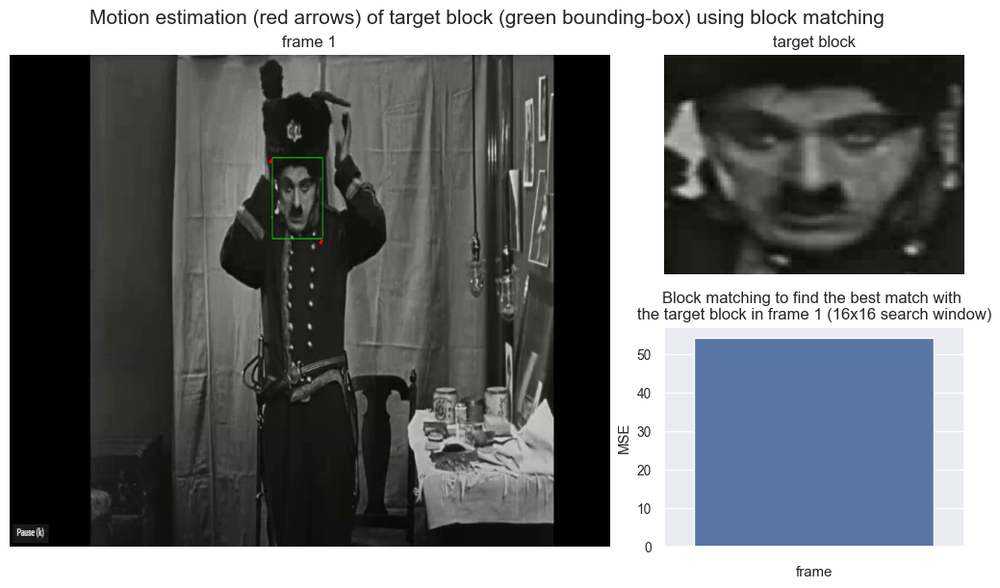

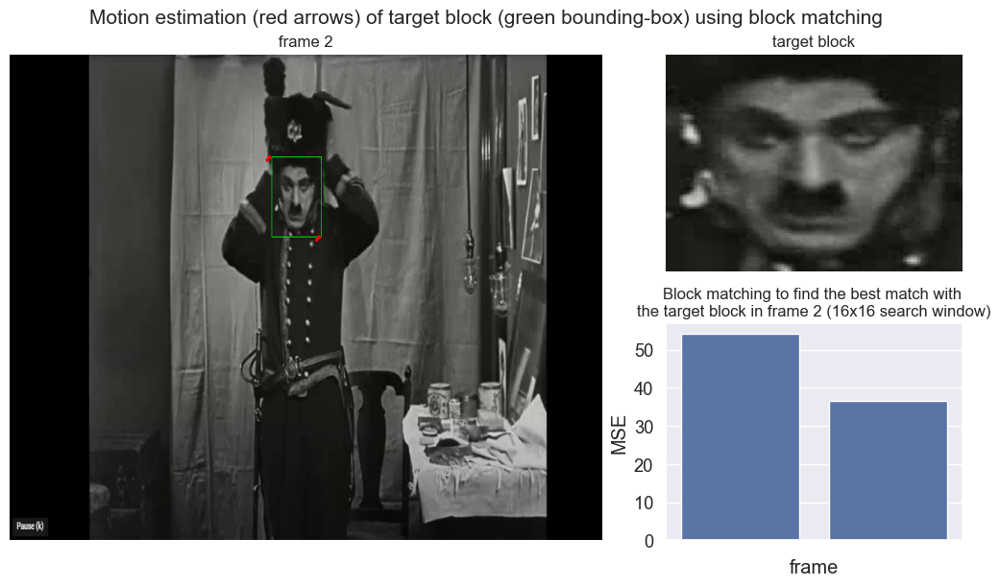

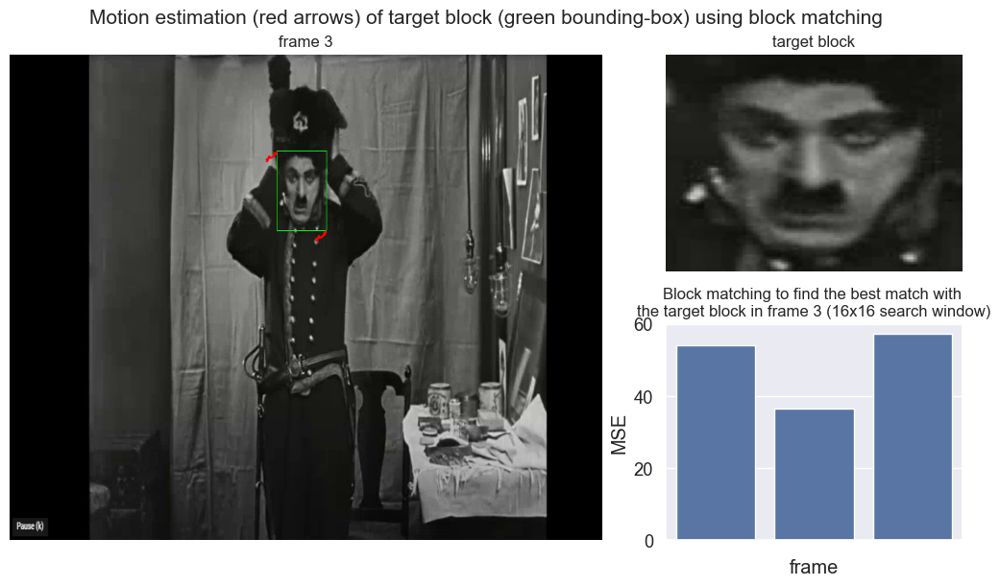

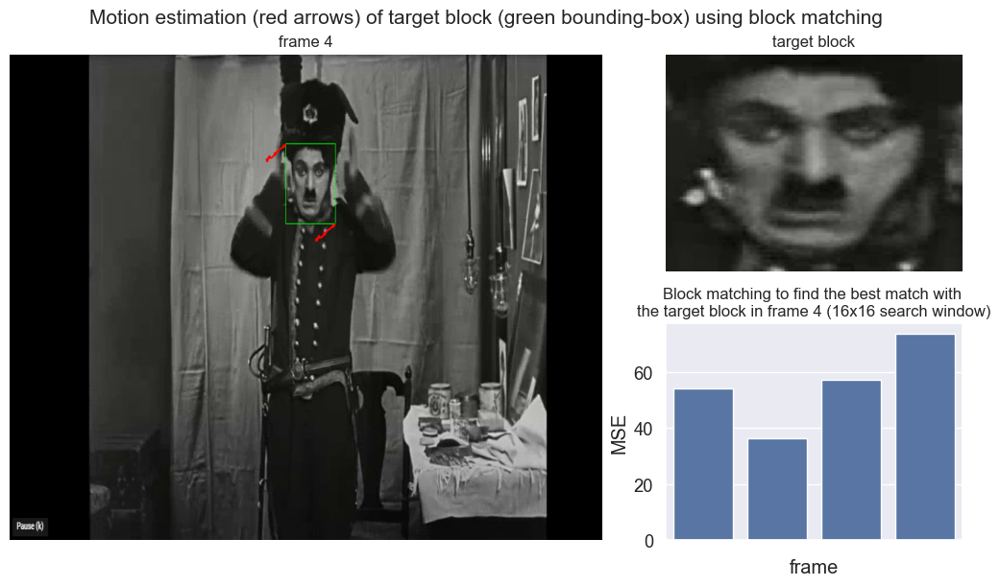

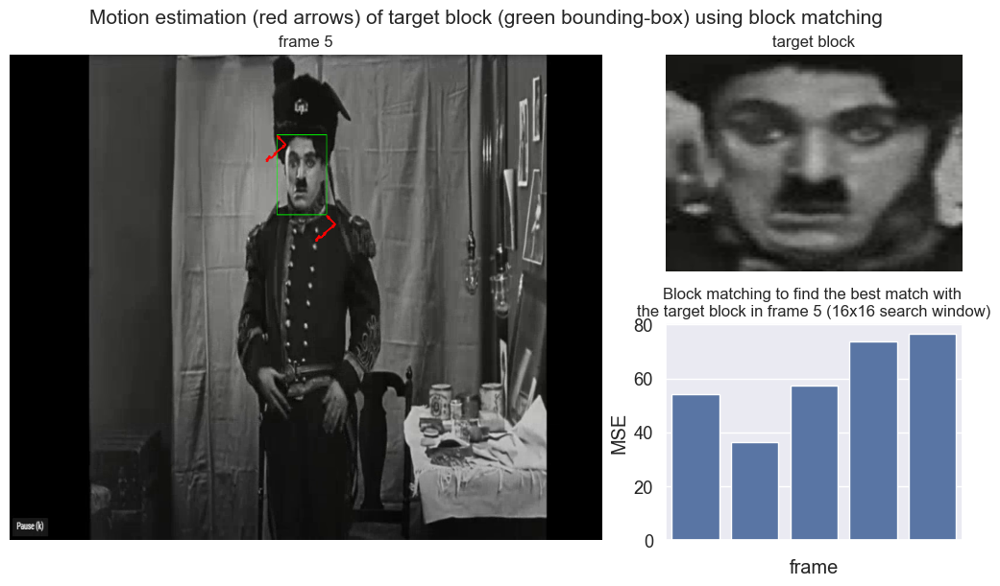

In [71]:
estimate_motion('images/charlie/frame_000.png', (120, 440, 210, 525), 
                ['images/charlie/frame_008.png', 'images/charlie/frame_012.png', 'images/charlie/frame_018.png', 
                 'images/charlie/frame_036.png', 'images/charlie/frame_060.png'], wsz=16)

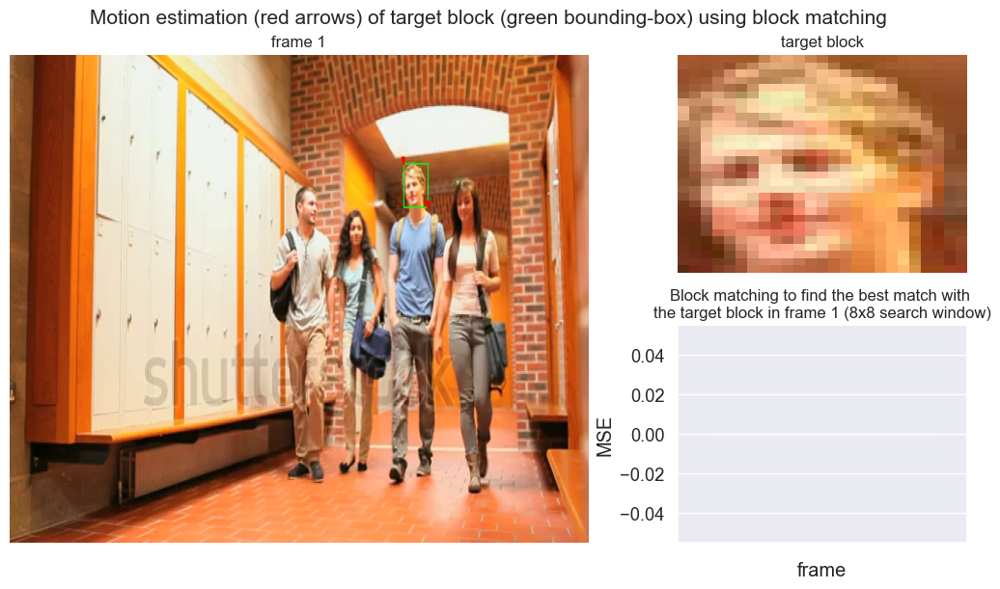

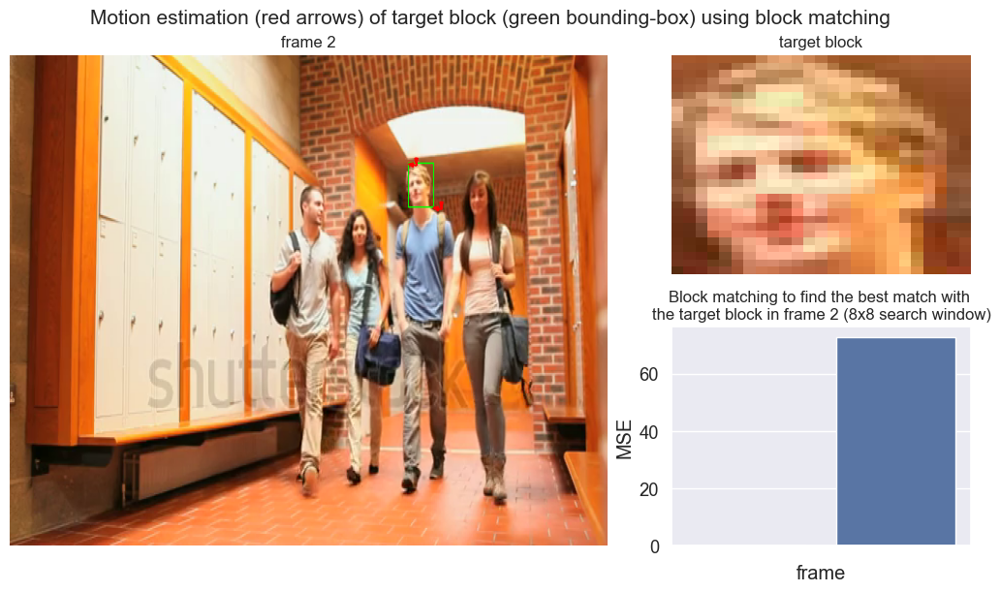

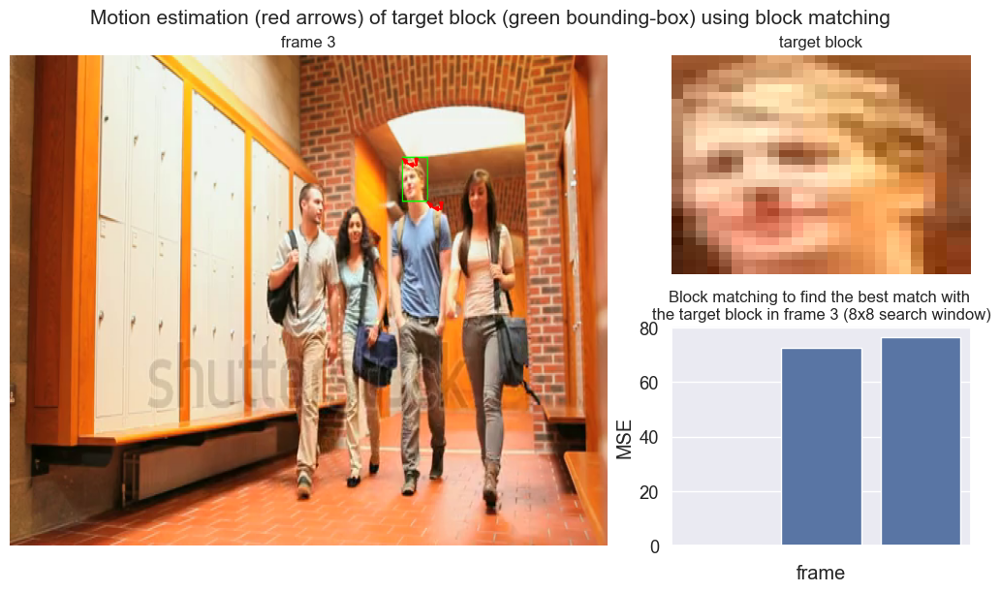

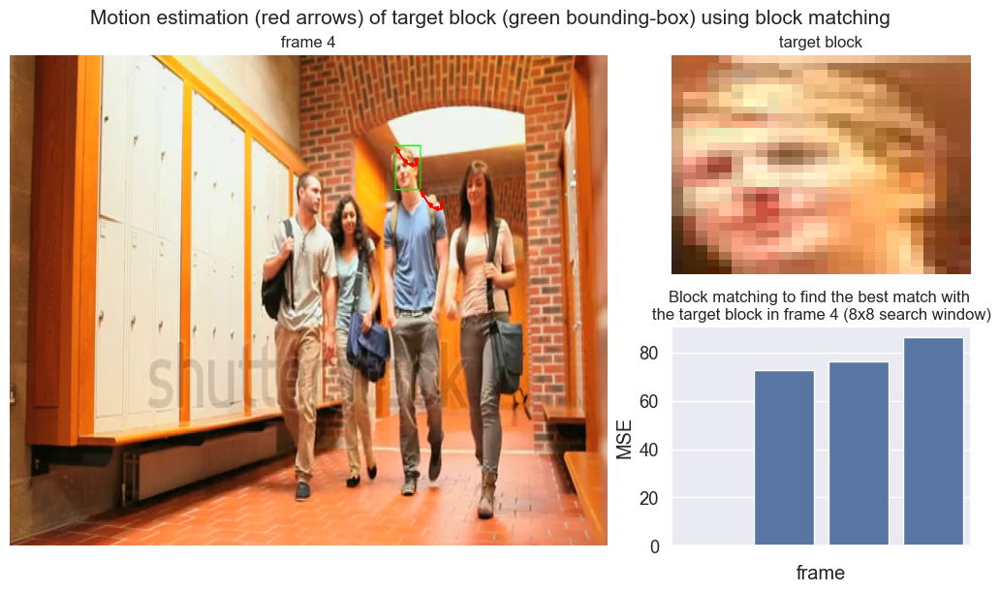

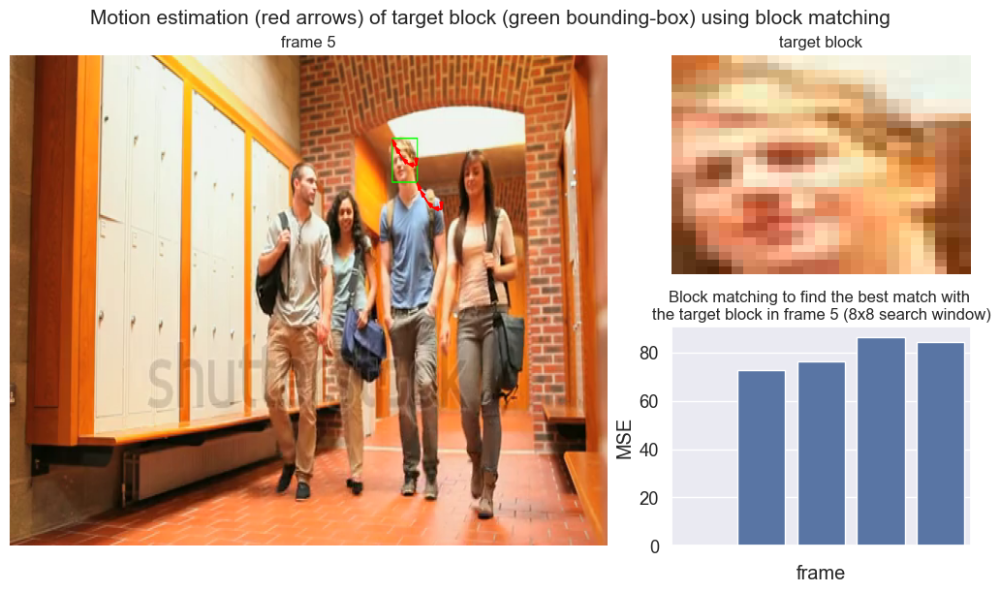

In [72]:
estimate_motion('images/students/frame0290.png', (75, 405, 105, 430), 
                ['images/students/frame0290.png', 'images/students/frame0295.png', 'images/students/frame0298.png', 
                 'images/students/frame0302.png', 'images/students/frame0306.png'])

## 11. Video Textures

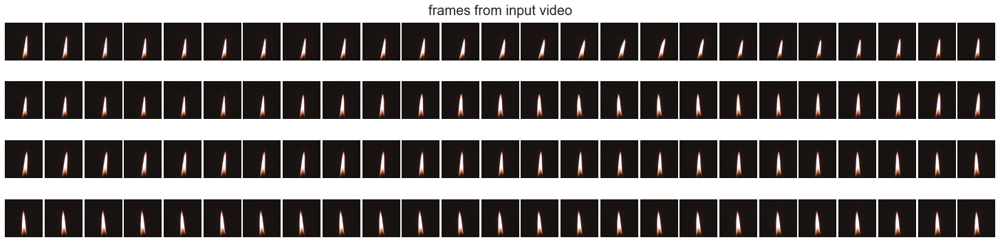

C:\Users\Sandipan.Dey\anaconda3\lib\site-packages\ipykernel_launcher.py:37: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


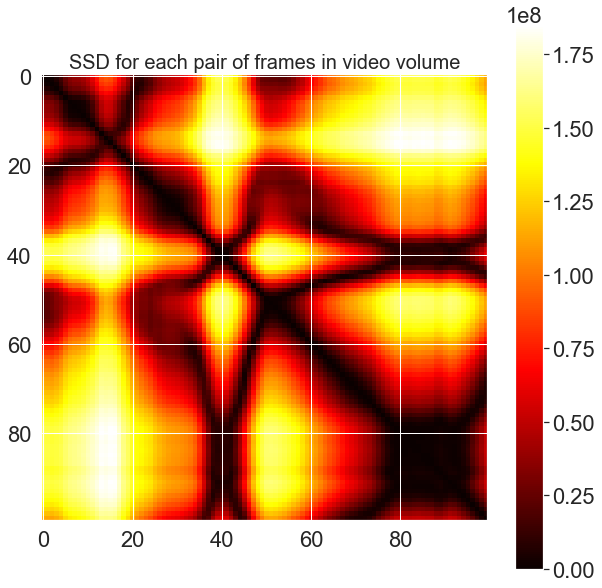

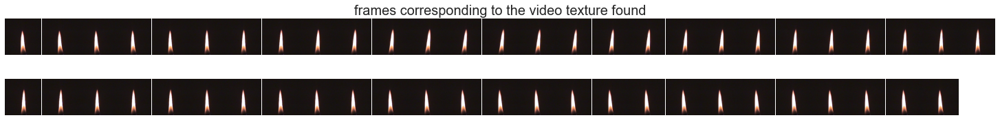

In [21]:
import numpy as np
import cv2
import matplotlib.pylab as plt
import scipy.signal
import sys
from scipy.stats import norm
from scipy.signal import convolve2d
import math
from glob import glob

def video_volume(image_list):
  '''Create a video volume from the image list.

  Input:
    image_list - a list of frames. Each element of the list contains a numpy
    array of a colored image. You may assume that each frame has the same shape,
    (rows, cols, 3).

  Output:
    output - a single 4d numpy array. This array should have dimensions
    (time, rows, cols, 3) and dtype np.uint8.
  '''
  output = np.array(image_list)
  return output

def SSD(video_volume):
  '''Compute the sum of squared distances for each pair of frames in video volume.
  Input:
    video_volume - as returned by your video_volume function.

  Output:
    output - a square 2d numpy array of dtype float. output[i,j] should contain 
    the SSD between frames i and j.
  '''
  video_volume = video_volume.astype(float)
  size_t = video_volume.shape[0]
  output = np.zeros((size_t, size_t), dtype = np.float)
  for i in range(size_t):
    for j in range(size_t):
      output[i, j] = np.square(video_volume[i,:,:,:] - video_volume[j,:,:,:]).sum()
  #print output.shape
  plt.figure(figsize=(10,10))
  plt.imshow(output, cmap='hot')
  plt.colorbar()
  plt.title('SSD for each pair of frames in video volume', size=20)
  plt.show()
  return output

def binomial_filter_5():
  ''' Create a binomial filter of length 4.
  '''
  return np.array([ 0.0625,  0.25,  0.375,  0.25,  0.0625], dtype=float)

def take_diff2(diff1):
  '''Compute the transition costs between frames, taking dynamics into account.
  
  Input:
  diff1 - a difference matrix as produced by your norm_L2 function.

  Output:
  output - a new difference matrix that takes preceding and following frames into 
           account. The cost of transitioning from i to j should weight the 
           surrounding frames according to the binomial filter provided to you 
           above. So, the difference between i and j has weight 0.375, the frames
           immediately following weight 0.25, etc...

           The output difference matrix should have the same dtype as the input,
           but be 4 rows and columns smaller, corresponding to only the frames
           that have valid dynamics.

  Hint: there is a very efficient way to do this with 2d convolution. Think about
        the coordinates you are using as you consider the preceding and following
        frame pairings.
  '''
  f = np.diag(binomial_filter_5())
  output = scipy.signal.convolve2d(diff1, f, 'valid')
  return output

def find_biggest_loop(diff2, alpha):
  '''Given the difference matrix, find the longest and smoothest loop that we can.
  
  Inputs:
  diff2 - a square 2d numpy array of dtype float. Each cell contains the cost
          of transitioning from frame i to frame j in the input video.

  alpha - a parameter for how heavily you should weigh the size of the loop
          relative to the transition cost of the loop. Larger alphas favor
          longer loops.

  Outputs:
  s - the beginning frame of the longest loop.
  f - the final frame of the longest loop.

  s, f will the indices in the diff2 matrix that give the maximum score
  according to the following metric:

  alpha*(f-s) - diff2[f,s]
  '''
  s = None
  f = None
  best = -sys.float_info.max
  
  for i in range(diff2.shape[1]): # iterate over starts
    for j in range(i, diff2.shape[0]): # iterate over finishes
      score = alpha*(j-i) - diff2[j,i] # cost of jump from finish to start
      if score > best:
        best = score
        s = i
        f = j
  return s, f

def synthesize_loop(video_volume, s, f):
  '''Pull out the given loop from video.
  
  Input:
  video_volume - a (t, row, col, 3) array, as created by your video_volume function.
  i - the index of the starting frame.
  j - the index of the ending frame.

  Output:
  output - a list of arrays of size (row, col, 3) and dtype np.uint8, similar to
  the original input the video_volume function in part0.
  '''
  output = [] 
  for idx in range(s,f+1):
    output.append(video_volume[idx,:,:,:])
  return output

def viz_diff(diff):
  return (((diff-diff.min())/(diff.max()-diff.min()))*255).astype(np.uint8)

def run_texture(img_list):
  ''' This function administrates the extraction of a video texture from the given frames.'''
  video_vol = video_volume(img_list)
  diff1 = SSD(video_vol)
  diff2 = take_diff2(diff1)
  alpha = 1.5*10**6
  idxs = find_biggest_loop(diff2, alpha)

  diff3 = np.zeros(diff2.shape, float)

  for i in range(diff2.shape[0]): 
    for j in range(diff2.shape[1]): 
      diff3[i,j] = alpha*(i-j) - diff2[i,j] 

  return viz_diff(diff1), viz_diff(diff2), viz_diff(diff3), synthesize_loop(video_vol, idxs[0]+2, idxs[1]+2)

img_list = []
for filename in glob('images/candle/*.png'):
    img_list.append(cv2.imread(filename))

plt.figure(figsize=(20,5))
plt.subplots_adjust(0,0,1,0.95,0.05,0.01)
for i in range(len(img_list)):
    plt.subplot(4,25,i+1), plt.imshow(cv2.cvtColor(img_list[i], cv2.COLOR_BGR2RGB)), plt.axis('off')
plt.suptitle('frames from input video', size=20)
plt.show()

diff1, diff2, diff3, out_list = run_texture(img_list)
plt.figure(figsize=(20,2.5))
plt.subplots_adjust(0,0,1,.95,0.01,0.05)
for i in range(len(out_list)):
    plt.subplot(2,27,i+1), plt.imshow(cv2.cvtColor(out_list[i], cv2.COLOR_BGR2RGB)), plt.axis('off')
plt.suptitle('frames corresponding to the video texture found', size=20)
plt.show()

## 12. Steganography with LSB data hiding using different number systems

In [89]:
import numpy as np
import matplotlib.pylab as plt
from skimage.io import imread
from skimage.metrics import peak_signal_noise_ratio as psnr
from cv2 import resize

In [92]:
def hide(cover, hidden, k=0): # assume h*w < cover image size
    cover_bytes = cover.flatten()
    hidden_bits = ''.join([bin(x)[2:].zfill(8) for x in hidden.flatten()])
    index = 0
    for bit in hidden_bits:
        if int(bit) == 1:
            cover_bytes[index] |= int(bin(2**k)[2:].zfill(8), 2)
        else:
            cover_bytes[index] &= int(bin((2**8-1) ^ 2**k)[2:].zfill(8),2)
        index += 1
    stego = cover_bytes.reshape(cover.shape)
    return stego

def extract(stego, h, w, k=0): 
    stego = stego.astype(np.uint8)
    stego_bytes = stego.flatten()
    hidden_bits = ''
    index = 0
    for index in range(8*h*w):
        hidden_bits += str((stego_bytes[index] & 2**k) >> k)
    hidden_bytes = []
    i = 0
    while i < len(hidden_bits):
        hidden_bytes.append(int(hidden_bits[i:i+8], 2))
        i += 8
    hidden_bytes = np.array(hidden_bytes, dtype=np.uint8)
    hidden = hidden_bytes.reshape((h, w))
    return hidden

def plot_images(cover, hidden, stego, extracted, base='Binary'):
    plt.figure(figsize=(10,3))
    plt.gray()
    plt.subplots_adjust(0,0,1,0.85,0.05,0.05)
    plt.subplot(141), plt.imshow(cover, aspect='auto'), plt.axis('off'), plt.title('cover image', size=12)
    plt.subplot(142), plt.imshow(hidden, aspect='auto'), plt.axis('off')
    plt.title('secret image', size=12)
    plt.subplot(143), plt.imshow(stego, aspect='auto'), plt.axis('off')
    plt.title('stego image, psnr={:.3f}'.format(psnr(cover, stego)), size=12)
    plt.subplot(144), plt.imshow(extracted, aspect='auto'), plt.axis('off')
    plt.title('extracted secret image', size=12)
    plt.suptitle(f'Hiding a secret image inside a cover image at bitplane {k} with LSB steganography with {base} Number System', size=15)
    plt.show()

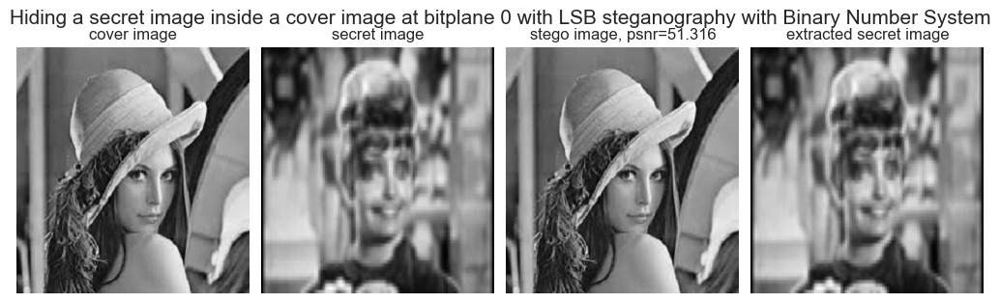

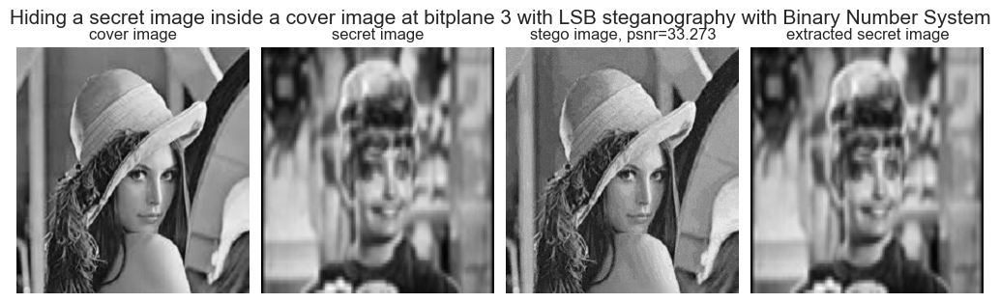

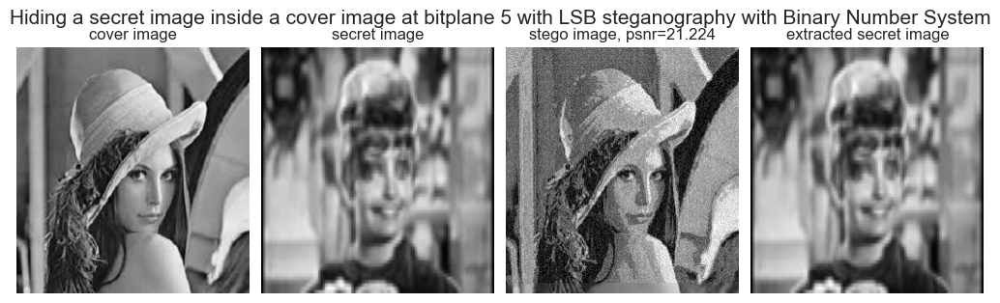

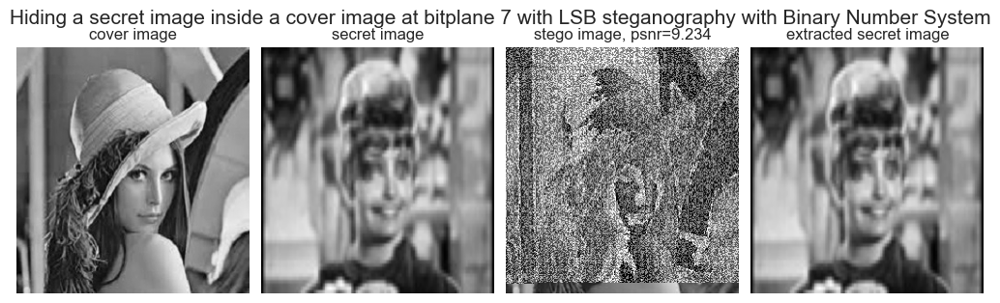

In [93]:
cover_img, hidden_img = 'images/lena.jpg', 'images/zelda.jpg'
for k in [0,3,5,7]:
    cover = (255*imread(cover_img, True)).astype(np.uint8)
    hidden = (255*imread(hidden_img, True)).astype(np.uint8)
    stego = hide(cover, hidden, k)
    h, w = hidden.shape
    extracted = extract(stego, h, w, k)
    plot_images(cover, hidden, stego, extracted)

In [94]:
prime_base = [1, 2, 3, 5, 7, 11, 13, 17, 19, 23, 29, 31, 37, 41, 43]
natural_base = list(range(1,24))

def bin2base(x, base, n): # assumption: 0 <= x <= 255
    s = ''
    i = n - 1
    while i >= 0:
        if x >= base[i]:
            x -= base[i]
            s += '1'
        else:
            s += '0'
        i -= 1
    return s

def base2bin(x, base):
    return sum([int(x[::-1][i])*base[i] for i in range(len(x))])

bin2base(162, prime_base, len(prime_base)), base2bin(bin2base(162, prime_base, len(prime_base)), prime_base)
bin2base(162, natural_base, len(natural_base)), base2bin(bin2base(162, natural_base, len(natural_base)), natural_base)

('11111111000000000100000', 162)

In [95]:
def init_base(base):
    n_bitplane = len(base)
    embedable = get_embedable_pixels(base)
    return base, n_bitplane, embedable

def is_embedable(n, k, base):
    nb = len(base)
    x = bin2base(n, base, nb)
    x1 = x[::-1]
    x1 = x1[:k] + str(1-int(x1[k])) + x1[k+1:]
    x1 = x1[::-1]
    return bin2base(base2bin(x, base), base, nb) == x and bin2base(base2bin(x1, base), base, nb) == x1

def get_embedable_pixels(base):
    n_bitplane = len(base)
    embedable = np.zeros((2**8, n_bitplane), dtype=bool)
    for k in range(n_bitplane):
        for n in range(2**8):
            embedable[n, k] = is_embedable(n, k, base)
    return embedable

In [96]:
def hide_with_base(cover, secret, base, embedable, k=1): # assume h*w < cover image size
    cover_bytes = cover.flatten()
    secret_bits = ''.join([bin(x)[2:].zfill(8) for x in secret.flatten()])
    cover_embedable = np.zeros_like(cover_bytes, dtype=np.uint8)
    i, index = 0, 0
    while i < len(secret_bits) and index < len(cover_bytes):
        bit = secret_bits[i]
        if embedable[cover_bytes[index], k]:
            cover_embedable[index] = 255
            cover_byte_rev = bin2base(cover_bytes[index], base, len(base))[::-1]
            cover_byte_rev = cover_byte_rev[:k] + str(bit) + cover_byte_rev[k+1:] 
            cover_bytes[index] = base2bin(cover_byte_rev[::-1], base)
            i += 1
        index += 1
    stego = cover_bytes.reshape(cover.shape)
    return stego

def extract_with_base(stego, h, w, base, embedable, k=1): 
    stego = stego.astype(np.uint8)
    stego_bytes = stego.flatten()
    secret_bits = ''
    i, index = 0, 0
    while i < 8*h*w and index < len(stego_bytes):
        if embedable[stego_bytes[index], k]:
            secret_bits += str(bin2base(stego_bytes[index], base, len(base))[::-1][k])
            i += 1
        index += 1
    secret_bytes = []
    i = 0
    while i < len(secret_bits):
        secret_bytes.append(int(secret_bits[i:i+8], 2))
        i += 8
    secret_bytes = np.array(secret_bytes, dtype=np.uint8)
    secret = secret_bytes.reshape((h, w))
    return secret

In [97]:
cover_img, secret_img = 'images/lena.jpg', 'images/zelda.jpg'
cover = (255*resize(imread(cover_img, True), None, fx=3.1, fy=3.1)).astype(np.uint8)
secret = (255*resize(imread(hidden_img, True), None, fx=1, fy=1)).astype(np.uint8)

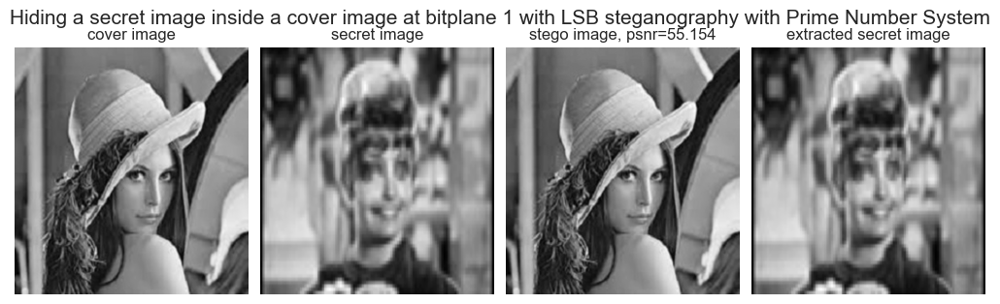

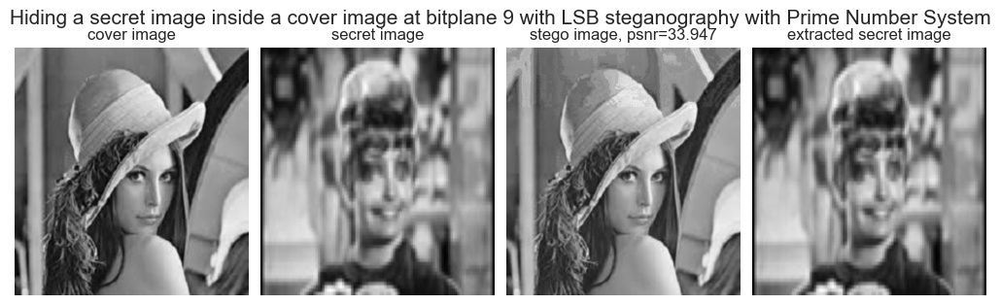

In [98]:
base, n_bitplane, embedable = init_base(prime_base)
for k in range(1, n_bitplane, 8):
    stego = hide_with_base(cover, secret, base, embedable, k)
    h, w = secret.shape
    extracted = extract_with_base(stego, h, w, base, embedable, k)
    plot_images(cover, secret, stego, extracted, 'Prime')

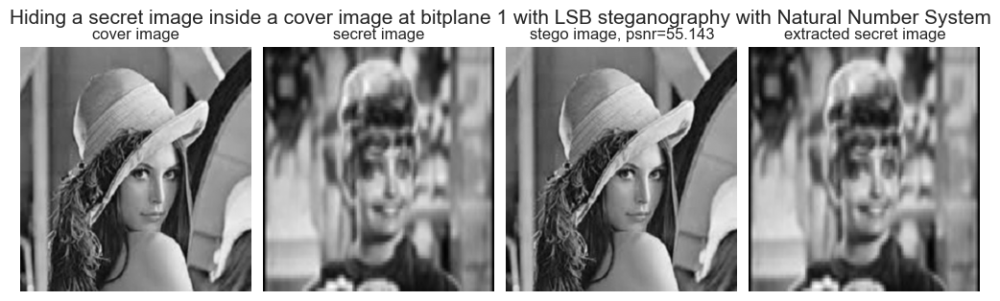

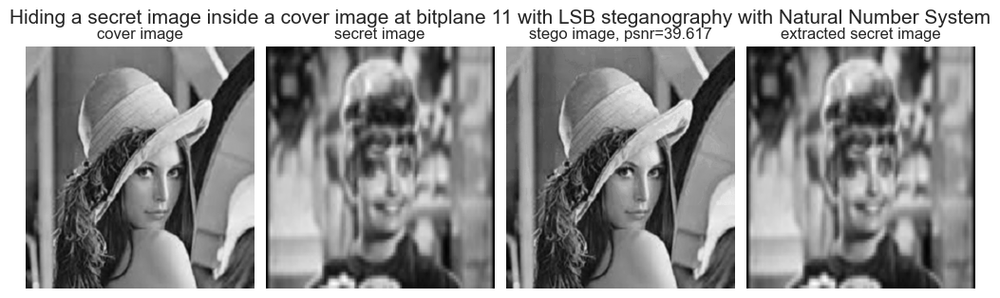

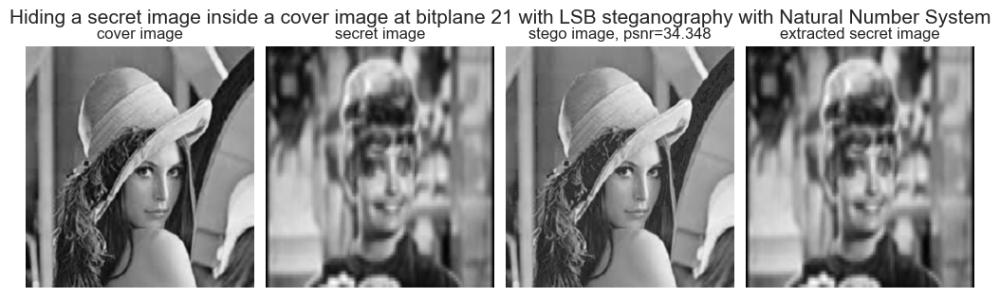

In [101]:
def hide_with_base(cover, secret, base, embedable, k=1): # assume h*w < cover image size
    cover_bytes = cover.flatten()
    secret_bits = ''.join([bin(x)[2:].zfill(8) for x in secret.flatten()])
    cover_embedable = np.zeros_like(cover_bytes, dtype=np.uint8)
    i, index = 0, 0
    while i < len(secret_bits) and index < len(cover_bytes):
        bit = secret_bits[i]
        if embedable[cover_bytes[index], k]:
            cover_embedable[index] = 255
            cover_byte_rev = bin2base(cover_bytes[index], base, len(base))[::-1]
            cover_byte_rev = cover_byte_rev[:k] + str(bit) + cover_byte_rev[k+1:] 
            cover_bytes[index] = base2bin(cover_byte_rev[::-1], base)
            i += 1
        index += 1
    stego = cover_bytes.reshape(cover.shape)
    return stego, cover_embedable.reshape(cover.shape)

base, n_bitplane, embedable = init_base(natural_base)
for k in range(1, n_bitplane, 10):
    stego, _ = hide_with_base(cover, secret, base, embedable, k)
    h, w = secret.shape
    extracted = extract_with_base(stego, h, w, base, embedable, k)
    plot_images(cover, secret, stego, extracted, 'Natural')

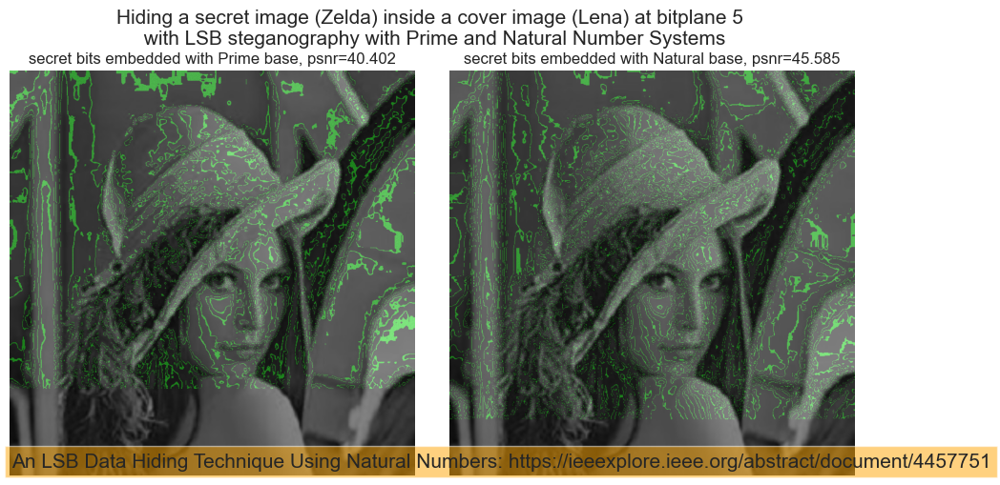

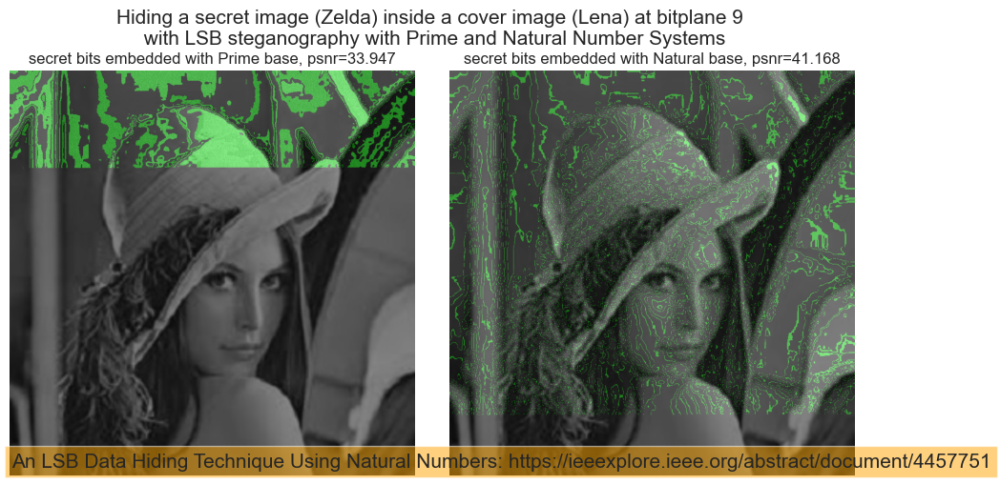

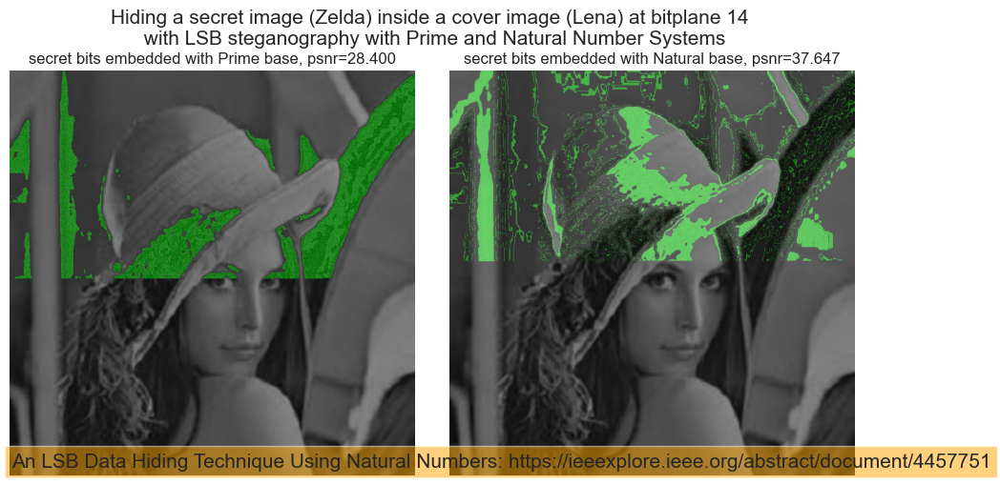

In [103]:
def get_embedded(cover, secret, base, k):
    base, n_bitplane, embedable = init_base(base)
    stego, embedable = hide_with_base(cover, secret, base, embedable, k)
    p = psnr(cover, stego)
    h, w = embedable.shape
    color_embedable = np.zeros((h, w, 3))
    color_embedable[...,1] = embedable
    stego = np.dstack((stego, stego, stego))
    embeded = (0.6*stego + 0.4*color_embedable).astype(np.uint8)
    return embeded, p
    
def plot_embedded(cover, secret, k):
    fig = plt.figure(figsize=(9,5))
    plt.gray()
    plt.subplots_adjust(0,0,1,0.85,0.05,0.05)
    embeded_p, psnr = get_embedded(cover, secret, prime_base, k)
    plt.subplot(121), plt.imshow(embeded_p), plt.axis('off')
    plt.title('secret bits embedded with Prime base, psnr={:.3f}'.format(psnr), size=12)
    embeded_N, psnr = get_embedded(cover, secret, natural_base, k)
    plt.subplot(122), plt.imshow(embeded_N), plt.axis('off')
    plt.title('secret bits embedded with Natural base, psnr={:.3f}'.format(psnr), size=12)
    plt.suptitle(f'Hiding a secret image (Zelda) inside a cover image (Lena) at bitplane {k} \n with LSB steganography with Prime and Natural Number Systems', size=15)
    plt.figtext(0.01, 0.01, 
                "An LSB Data Hiding Technique Using Natural Numbers: https://ieeexplore.ieee.org/abstract/document/4457751", 
                ha="left", va='bottom', fontsize=15, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})
    plt.show()

plot_embedded(cover, secret, 5)
plot_embedded(cover, secret, 9)
plot_embedded(cover, secret, 14)

In [43]:
import pandas as pd
import seaborn as sns

binary_psnrs = []
for k in range(7):
    stego = hide(cover, secret, k)
    binary_psnrs.append(psnr(cover, stego))

base, n_bitplane, embedable = init_base(prime_base)
prime_psnrs = []
for k in range(n_bitplane):
    stego, _ = hide_with_base(cover, secret, base, embedable, k)
    prime_psnrs.append(psnr(cover, stego))

base, n_bitplane, embedable = init_base(natural_base)
natural_psnrs = []
for k in range(n_bitplane):
    stego, _ = hide_with_base(cover, secret, base, embedable, k)
    natural_psnrs.append(psnr(cover, stego))
    
df = pd.DataFrame({'natural': natural_psnrs})
df['prime'] = prime_psnrs + [None]*(len(df)-len(prime_psnrs))
df['binary'] = binary_psnrs + [None]*(len(df)-len(binary_psnrs))
df['bitplane'] = list(range(len(df)))
df.head()

,natural,prime,binary,bitplane
0,61.126771,61.171215,61.148384,0
1,55.142853,55.153530,55.130683,1
2,51.649232,51.612865,49.148506,2
3,49.155199,47.221467,43.111219,3
4,47.198896,44.326230,36.992500,4


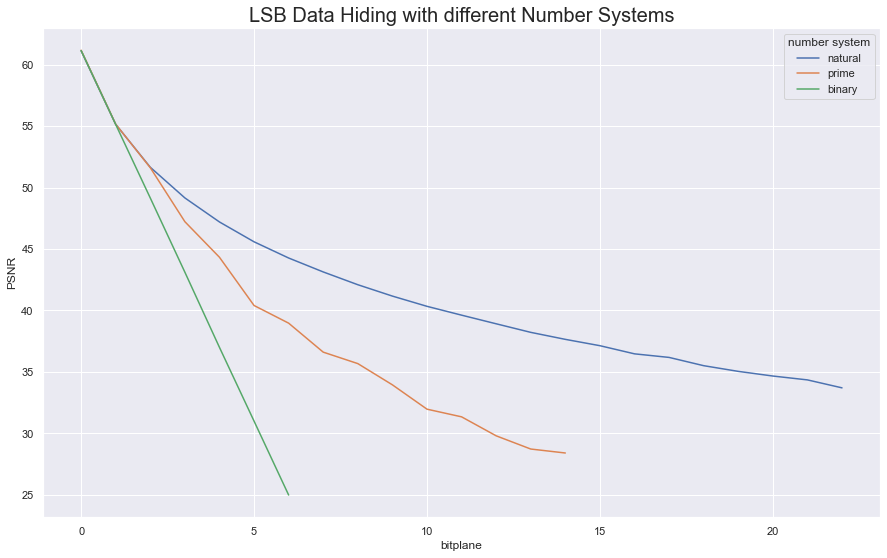

In [44]:
df = pd.melt(df, id_vars=['bitplane'], var_name='number system', value_name='PSNR')
sns.set()
plt.figure(figsize=(15,9))
sns.lineplot(data=df, x="bitplane", y="PSNR", hue="number system")
plt.title('LSB Data Hiding with different Number Systems', size=20)
plt.show()

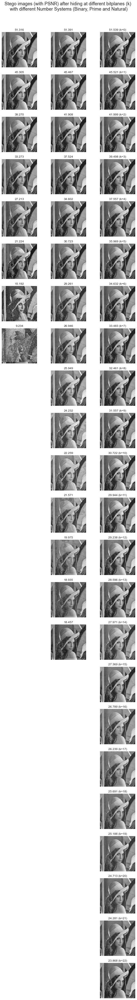

In [46]:
cover = (255*imread(cover_img, True)).astype(np.uint8)
secret = (255*imread(hidden_img, True)).astype(np.uint8)
n_b_bitplane = 8
p_base, n_p_bitplane, p_embedable = init_base(prime_base)
N_base, n_N_bitplane, N_embedable = init_base(natural_base)
p_embedable = np.ones_like(p_embedable)
N_embedable = np.ones_like(N_embedable)
plt.figure(figsize=(8,56))
plt.gray()
plt.subplots_adjust(0,0,1,0.95,0.05,0.2)
j = 1
for k in range(n_N_bitplane):
    if k < n_b_bitplane:
        stego_b = hide(cover, secret, k)
        plt.subplot(n_N_bitplane,3,j), plt.imshow(stego_b), plt.axis('off'), plt.title('{:.3f}'.format(psnr(cover, stego_b)), size=12)
    if k < n_p_bitplane:
        stego_p, _ = hide_with_base(cover, secret, p_base, p_embedable, k)
        plt.subplot(n_N_bitplane,3,j+1), plt.imshow(stego_p), plt.axis('off'), plt.title('{:.3f}'.format(psnr(cover, stego_p)), size=12)
    if k < n_N_bitplane:
        stego_N, _ = hide_with_base(cover, secret, N_base, N_embedable, k)
        plt.subplot(n_N_bitplane,3,j+2), plt.imshow(stego_N), plt.axis('off'), plt.title('{:.3f} (k={})'.format(psnr(cover, stego_N), k), size=12)
    j += 3
plt.suptitle('Stego images (with PSNR) after hiding at different bitplanes (k) \n'
             'with different Number Systems (Binary, Prime and Natural)', size=18)
plt.show()

## 13. Neighborhood Discovery with Markov Model

In [33]:
import numpy as np
from skimage.io import imread
from skimage.color import rgb2gray, gray2rgb
import matplotlib.pylab as plt

(256, 256)
1.0


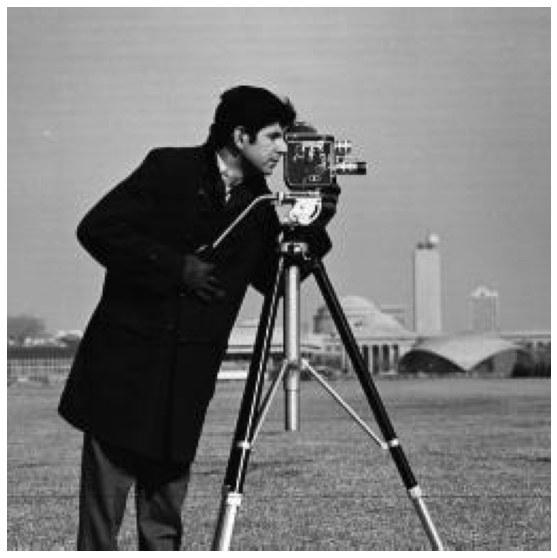

In [34]:
imfile = 'images/cameraman.png' #'ele.jpg'  #'whale.jpg'  #'me5.jpg' #'vic.jpg' #'cameraman.jpg'   #'cat.jpg' #'tram.jpg'    #'horses.png' #'lena.jpg' #'whale.jpg' #'lena.jpg' #'simple.png' # 'lena.jpg'

orig_im = imread(imfile)[...,:3]
im = rgb2gray(orig_im)
print(im.shape)
print(np.max(im))
plt.figure(figsize=(10,10))
plt.gray()
plt.imshow(im), plt.axis('off')
plt.show()

In [35]:
nhb, nwb = 50, 50 #22, 22

h, w = im.shape[0] // nhb, im.shape[1] // nwb
print(h, w, im.shape)
#SuperPixel(0, 0, im, True)

5 5 (256, 256)


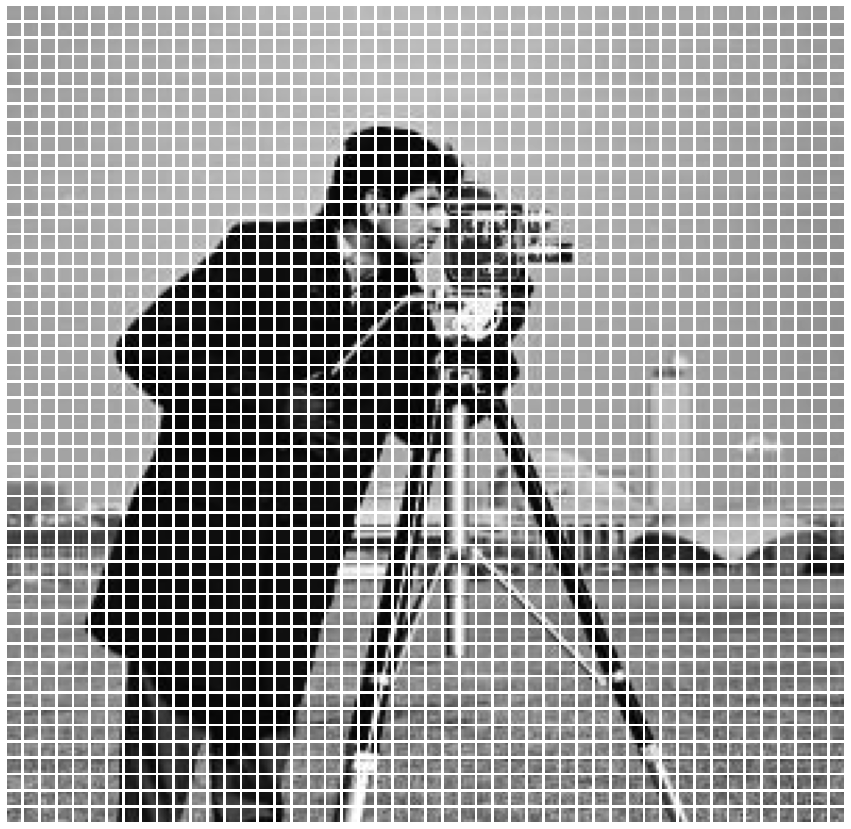

In [36]:
plt.figure(figsize=(15,15))
#plt.subplots_adjust(0,0,1,1,0.05,0.05)
for i in range(nhb*nwb):
    xi, yi = h * (i // nhb), w * (i % nwb)
    ims = im[xi:xi+h, yi:yi+w]
    plt.subplot(nhb, nwb, i+1)
    plt.imshow(ims, vmin=im.min(), vmax=im.max())
    plt.axis('off')
#plt.tight_layout()
plt.show()

In [37]:
def plot_mat(p, niter):
    p = p.copy()
    p = p / p.sum(axis=1, keepdims=1)
    p[np.isnan(p)] = 0
    #p1 = p.copy()
    for i in range(niter):
        p = p @ p
        #v = p[0,:]/np.sum(p[0,:])
        #p1 = p1 @ p
    #v = p1[0,:]/np.sum(p1[0,:])
    v = p[0,:]/np.sum(p[0,:])
    v = (v - np.min(v)) / (np.max(v) - np.min(v))
    plt.figure(figsize=(10,10))
    plt.gray()
    plt.imshow(np.reshape(v, (nhb, nwb)), vmin=im.min(), vmax=im.max())
    plt.title('{}x{} Markov Transition Matrix, Converging to Stationary Distribution\n'
              'Steady State Vector (reshaped into 50x50 image) computed with Power Iteration (Iter = {})'.format(nhb*nwb, nhb*nwb, i+1), size=20)
    plt.figtext(0.01, 0.01, 
            "Ref: Temporal Neighborhood Discovery Using Markov Models:\nhttps://ieeexplore.ieee.org/document/5360236", 
            ha="left", va='bottom', fontsize=25, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})
    plt.tight_layout()
    plt.show()

In [38]:
p = np.zeros((nhb*nwb,nhb*nwb))

In [39]:
def log(x):
    return np.log(x) if x > 0 else 0

eps = 1e-3
for i in range(p.shape[0]):
    ri, ci = i // nhb, i % nwb
    xi, yi = h * ri, w * ci
    ims = im[xi:xi+h, yi:yi+w]
    mi, si = np.mean(ims), np.std(ims)
    for j in range(i+1, p.shape[1]):
        rj, cj = j // nhb, j % nwb
        xj, yj = h * rj, w * cj
        if abs(ri - rj) <= 1 and abs(ci - cj) <= 1:
            mj, sj = np.mean(im[xj:xj+h, yj:yj+w]), np.std(im[xj:xj+h, yj:yj+w])
            #d = (2*log(sj/(si+eps)) + si**2/(sj+eps)**2 + (mi - mj)**2/(sj+eps)**2 - 1) / 2 #KL
            d = 2*(mi - mj)**2/(si**2 + sj**2 + eps) # Mahalanobis
            #d = sum(d)
            p[i,j] = p[j,i] = np.exp(-d)

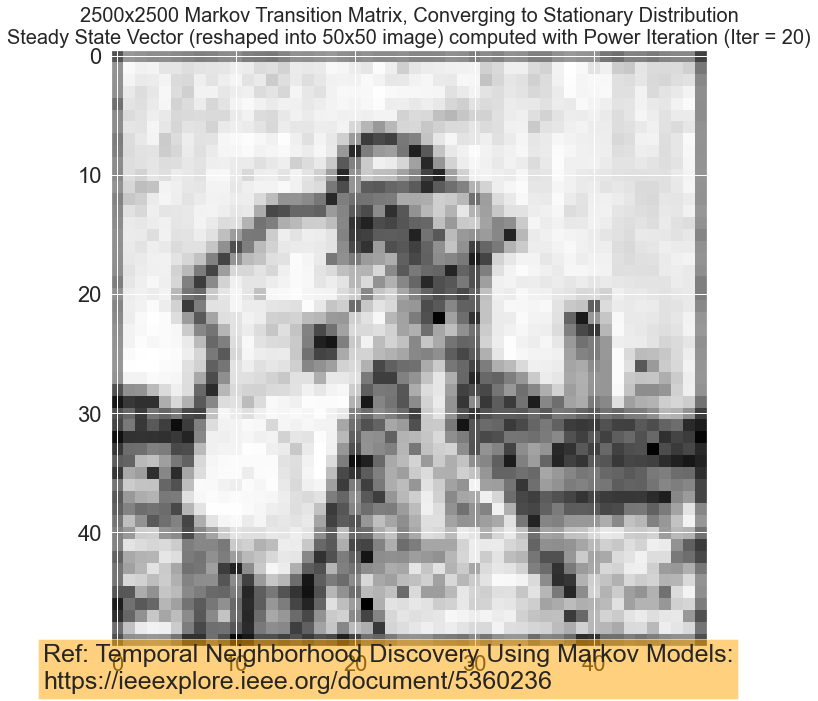

In [40]:
plot_mat(p, 20)